## Setup

In [1]:
%load_ext autoreload
%autoreload 3
import sys

sys.path.append("..")
sys.path.append("../generalization")
from nnsight import LanguageModel, CONFIG
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch as th
import torch  # for those who are afraid of th
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm, trange
import seaborn as sns
from transformers import AutoTokenizer, AutoModelForCausalLM, AutoConfig
from pathlib import Path
from time import time
import itertools
from dataclasses import dataclass
from warnings import warn
from random import shuffle, sample
# Fix logger bug
import babelnet
from nnsight import logger

logger.disabled = True
th.set_grad_enabled(False)
import os

2024-08-09 13:24:54,335 [babelnet.conf] INFO: Loaded configuration from ['/dlabscratch1/cdumas/babelnet_conf.yml']
2024-08-09 13:24:54,339 [babelnet.api] INFO: BabelNet Remote Procedure Call API v1.2.0


In [2]:
from utils import plot_topk_tokens, display_df
from exp_tools import next_token_probs, prompts_to_df, prompts_to_str, filter_prompts, load_model
from translation_tools import get_bn_dataset
from prompt_tools import translation_prompts

2024-08-09 13:24:56,435 [datasets] INFO: PyTorch version 2.2.2 available.


In [3]:
llama_like = "/dlabscratch1/public/llm_weights/llama2_hf/Llama-2-7b-hf"
nn_model = load_model(llama_like, dispatch=True)
tokenizer = nn_model.tokenizer

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [4]:
batch_size = 16
num_layers = len(nn_model.model.layers)
in_lang = "de"
out_lang = "fr"

In [5]:
from interventions import collect_activations
def get_mean_activations(nn_model, prompts_str, batch_size=batch_size):
    dataloader = DataLoader(prompts_str, batch_size=batch_size, shuffle=False)
    acts = []
    for batch in tqdm(dataloader):
        acts.append(collect_activations(nn_model, batch))
    mean_activations = []
    for layer in range(num_layers):
        mean_activations.append(th.cat([a[layer] for a in acts]).mean(0))
    return mean_activations

In [6]:
tr_df = get_bn_dataset(in_lang, out_lang)
prompts = filter_prompts(translation_prompts(tr_df, nn_model.tokenizer, in_lang, out_lang, in_lang, augment_tokens=False))
print(f"Using {len(prompts)} prompts")
prompts_str = [p.prompt for p in prompts]
def get_rnd_prompts(n=3):
    return sample(prompts, n)

Using 80 prompts


In [7]:
display_df(prompts_to_df(prompts[:2]))

,0,1
prompt,"Deutsch: ""Gesicht"" - Français: ""face""\nDeutsch: ""Kind"" - Français: ""mineur""\nDeutsch: ""Stern"" - Français: ""étoile""\nDeutsch: ""Tür"" - Français: ""encadrement de porte""\nDeutsch: ""Linie"" - Français: ""droite""\nDeutsch: ""Buch"" - Français: ""","Deutsch: ""Stern"" - Français: ""étoile""\nDeutsch: ""Quadrat"" - Français: ""carré""\nDeutsch: ""Schnee"" - Français: ""neige""\nDeutsch: ""Ball"" - Français: ""ballon""\nDeutsch: ""Farbe"" - Français: ""noir""\nDeutsch: ""Wolke"" - Français: """
target_strings,"[livre, papier]",[nuage]
de_string,"[Buch, totes Holz, Papier, Totholz]","[Wolke, Gewölk]"


In [8]:
in_id_prompts = translation_prompts(tr_df, nn_model.tokenizer, in_lang, in_lang, augment_tokens=False)
in_id_prompts_str = [p.prompt for p in in_id_prompts]
out_id_prompts = translation_prompts(tr_df, nn_model.tokenizer, out_lang, out_lang, augment_tokens=False)
out_id_prompts_str = [p.prompt for p in out_id_prompts]

In [9]:
translation_mean = get_mean_activations(nn_model, prompts_str)
in_id_mean = get_mean_activations(nn_model, in_id_prompts_str)
out_id_mean = get_mean_activations(nn_model, out_id_prompts_str)
in_steering_vectors = [i - t for i, t in zip(in_id_mean, translation_mean)]
out_steering_vectors = [o - t for o, t in zip(out_id_mean, translation_mean)]

  0%|          | 0/5 [00:00<?, ?it/s]

You're using a LlamaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 144.00 MiB. GPU 0 has a total capacity of 39.39 GiB of which 37.00 MiB is free. Process 203851 has 17.86 GiB memory in use. Process 348350 has 21.49 GiB memory in use. Of the allocated memory 19.62 GiB is allocated by PyTorch, and 1.37 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
def steering(nn_model, prompt_batch, steering_vectors, factor=1, scan=True):
    num_layers = len(nn_model.model.layers)
    probs_l = []
    for layer in trange(num_layers):
        with nn_model.trace(prompt_batch, scan=scan and layer == 0):
            nn_model.model.layers[layer].output[0][:, -1] += steering_vectors[layer] * factor
            output = nn_model.lm_head.output
            probs = output[:, -1, :].softmax(-1).cpu().save()
            probs_l.append(probs)

    probs = th.cat(probs_l, dim=0)
    return probs.reshape(num_layers, len(prompt_batch), -1).transpose(0, 1)

## Language steering

In [4]:
probs = next_token_probs(nn_model, prompts_str[:3])
plot_topk_tokens(probs, nn_model)

NameError: name 'next_token_probs' is not defined

  0%|          | 0/32 [00:00<?, ?it/s]

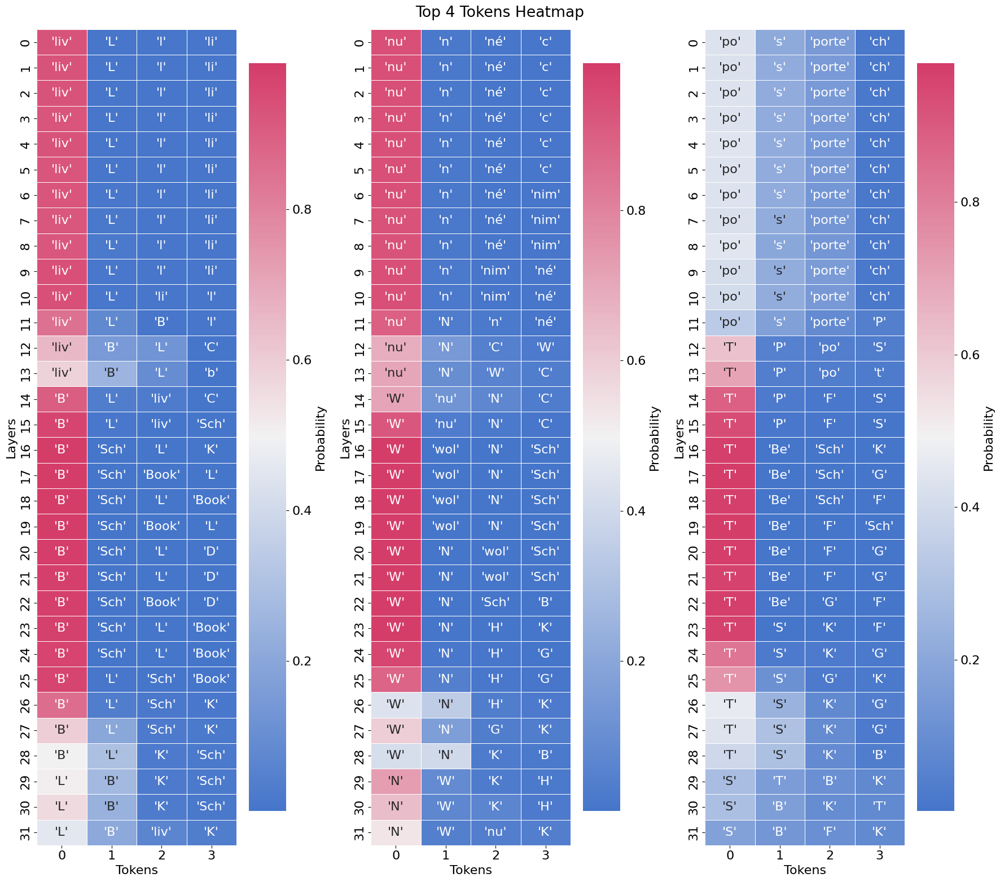

In [ ]:
probs = steering(nn_model, prompts_str[:3], in_steering_vectors)
plot_topk_tokens(probs, nn_model)

  0%|          | 0/32 [00:00<?, ?it/s]

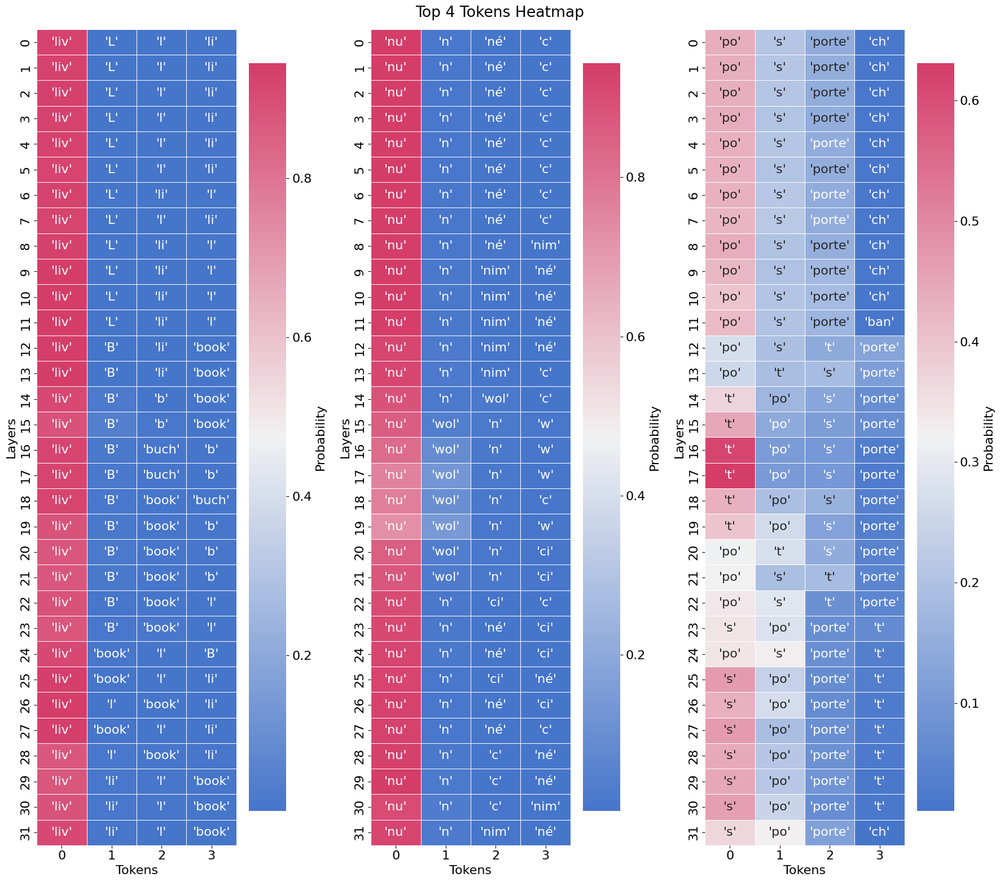

In [ ]:
probs = steering(nn_model, prompts_str[:3], out_steering_vectors)
plot_topk_tokens(probs, nn_model)

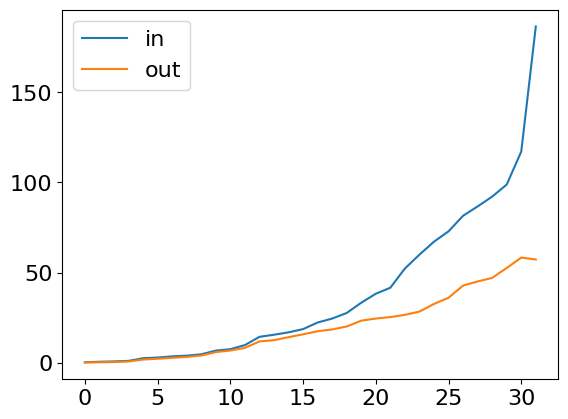

In [ ]:
in_norms = [v.norm() for v in in_steering_vectors]
out_norms = [v.norm() for v in out_steering_vectors]
plt.plot(in_norms, label="in")
plt.plot(out_norms, label="out")
plt.legend()
plt.show()

## Steering with repetition task

In [ ]:
all_df = get_bn_dataset("es", ["fr", "en", "de", "fi", "zh", "ru", "nl", "ja"])

In [ ]:
all_langs =  ["es", "fr", "en", "de", "fi", "zh", "ru", "nl", "ja"]
synt_df = {"A": [], "B": []}
for idx, row in all_df.iterrows():
    for lang in all_langs:
        # add row[lang] to the A and B columns of synt_df
        synt_df["A"].append(row[lang][0])
        synt_df["B"].append(row[lang][0])
synt_df = pd.DataFrame(synt_df)
synt_df = synt_df.sample(frac=1).reset_index(drop=True)

In [ ]:
synt_prompts = translation_prompts(synt_df, nn_model.tokenizer, "A", "B", augment_tokens=False, n=7)
shuffle(synt_prompts)
# synt_prompts = synt_prompts[:len(in_id_prompts)]
synt_prompts_str = [p.prompt for p in synt_prompts]

In [ ]:
synth_mean = get_mean_activations(nn_model, synt_prompts_str, batch_size=1)

  0%|          | 0/954 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
synth_steering_vectors = [s - t for s, t in zip(synth_mean, translation_mean)]

In [ ]:
rnd_prompts = sample(prompts, 3)
rnd_prompts_str = [p.prompt for p in rnd_prompts]
probs = steering(nn_model, rnd_prompts_str, synth_steering_vectors)
plot_topk_tokens(probs, nn_model)
display_df(prompts_to_df(rnd_prompts))

  0%|          | 0/32 [00:00<?, ?it/s]

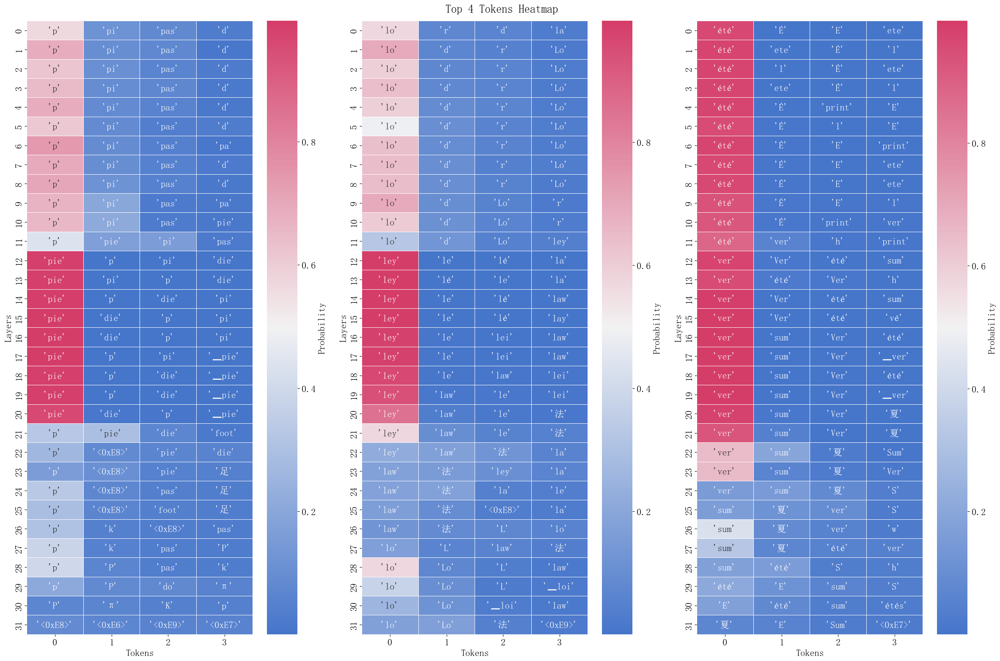

In [ ]:
probs2 = steering(nn_model, rnd_prompts_str, synth_steering_vectors, factor=2)
plot_topk_tokens(probs2, nn_model)


## Layer Skip experiment

In [ ]:
from interventions import skip_layers, get_num_layers, get_next_token_probs


def layer_skip_lens(nn_model, prompt_batch, num_skips=5, scan=True):
    num_layers = get_num_layers(nn_model)
    probs_l = []
    for layer in range(num_layers):
        with nn_model.trace(prompt_batch, scan=layer == 0 and scan):
            skip_layers(nn_model, layer, num_layers=num_skips)
            probs = get_next_token_probs(nn_model).cpu().save()
            probs_l.append(probs)
    return (
        th.cat(probs_l, dim=0)
        .reshape(num_layers, len(prompt_batch), -1)
        .transpose(0, 1)
    )

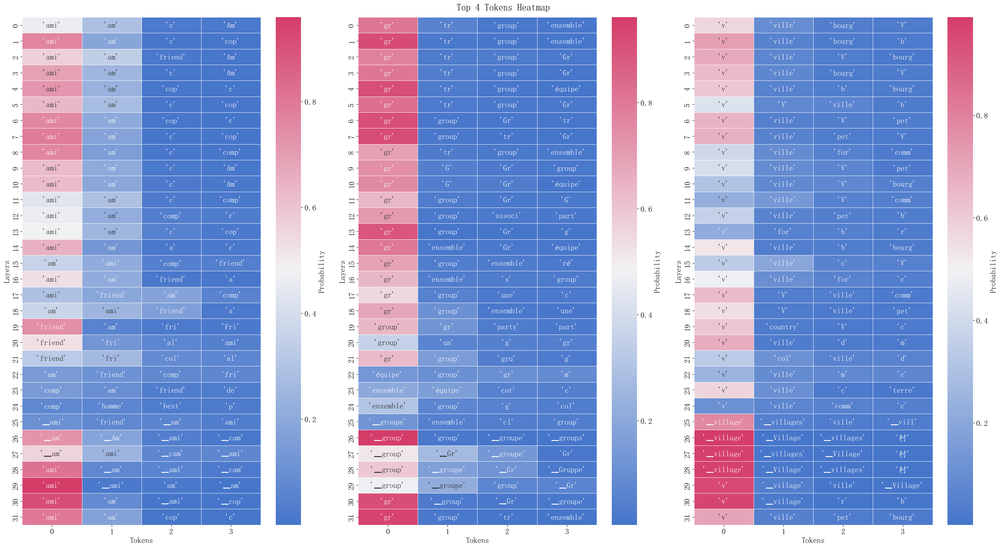

,0,1,2
prompt,"Deutsch: ""Wald"" - Français: ""forêt""\nDeutsch: ""Straße"" - Français: ""route""\nDeutsch: ""Talent"" - Français: ""aptitude""\nDeutsch: ""tausend"" - Français: ""mille""\nDeutsch: ""Farbe"" - Français: ""noir""\nDeutsch: ""Freund"" - Français: ""","Deutsch: ""rot"" - Français: ""rouge""\nDeutsch: ""zehn"" - Français: ""dix""\nDeutsch: ""Wald"" - Français: ""forêt""\nDeutsch: ""fünf"" - Français: ""cinq""\nDeutsch: ""Paar"" - Français: ""paire""\nDeutsch: ""Gruppe"" - Français: ""","Deutsch: ""Art"" - Français: ""type""\nDeutsch: ""Fluss"" - Français: ""rivière""\nDeutsch: ""Wolke"" - Français: ""nuage""\nDeutsch: ""Straße"" - Français: ""route""\nDeutsch: ""Holz"" - Français: ""forêt""\nDeutsch: ""Dorf"" - Français: """
target_strings,"[camaraderie, amitié, ami, amie, petit ami, mec, copain, homme, parent, géniteur, génitrice]","[ensemble musical, famille, groupe fonctionnel, groupe, orchestre, équipe, groupe de rock, catégorie, classe, bouquet, botte, regroupement]","[hameau, village]"
de,"[Freund, Kameradschaft, Freundschaft, Freundin, Verwandte, Verwandter, Blutsfreundin, Blutsverwandter, Blutsverwandte, Familienangehöriger, Familienangehörige, Angehöriger, Angehörige, Blutsfreund]","[Gruppe, Ensemble, Bruchteil, funktionelle Gruppe, Band, Combo, Kapelle, Musikkapelle, Musikbande, Rockgruppe, Rock-Gruppe, Rockband, Klasse, Kategorie, Strauß, Bund]","[Dorf, Ortschaft, Weiler, Dörfchen]"


In [ ]:
rnd_prompts_skip = get_rnd_prompts()
rnd_prompts_skip_str = prompts_to_str(rnd_prompts_skip)
skip_probs = layer_skip_lens(nn_model, rnd_prompts_skip_str, num_skips=5)
plot_topk_tokens(skip_probs, nn_model)
display_df(prompts_to_df(rnd_prompts_skip))

In [ ]:
from nnsight_utils import (
    get_num_layers,
    get_next_token_probs,
    get_attention_output,
    get_attention,
)
from interventions import skip_layers


def patch_skip_lens(
    nn_model,
    source_prompt_batch,
    prompt_batch,
    num_skips=5,
    scan=True,
    attn_idx_patch=-2,
):
    num_layers = get_num_layers(nn_model)
    probs_l = []
    for layer in range(num_layers):
        hiddens = collect_activations(
            nn_model,
            source_prompt_batch,
            layers=list(range(layer + num_skips + 1, num_layers)),
        )
        with nn_model.trace(prompt_batch, scan=layer == 0 and scan):
            skip_layers(nn_model, layer, num_layers=num_skips)
            for i, hidden in enumerate(hiddens):
                get_attention(nn_model, i + layer + num_skips + 1).input[1][
                    "hidden_states"
                ][:, attn_idx_patch] = hidden
            probs = get_next_token_probs(nn_model).cpu().save()
            probs_l.append(probs)
    return (
        th.cat(probs_l, dim=0)
        .reshape(num_layers, len(prompt_batch), -1)
        .transpose(0, 1)
    )

In [ ]:
nn_model.tokenizer.convert_ids_to_tokens(nn_model.tokenizer(rnd_prompts_skip_str[0][-50:]).input_ids)

['<s>',
 '-',
 '▁Fran',
 'çais',
 ':',
 '▁"',
 'no',
 'ir',
 '"',
 '<0x0A>',
 'De',
 'utsch',
 ':',
 '▁"',
 'Fre',
 'und',
 '"',
 '▁-',
 '▁Fran',
 'çais',
 ':',
 '▁"']

In [ ]:
es_df = get_bn_dataset("es", ["zh", "fr"])
prompts_es_zh = filter_prompts(translation_prompts(es_df, nn_model.tokenizer, "es", "zh", ["es", "fr"], augment_tokens=False))
de_df = get_bn_dataset("de", ["es", "fr"])
prompts_de_fr = filter_prompts(translation_prompts(de_df, nn_model.tokenizer, "de", "fr", ["de", "es"], augment_tokens=False))
target_prompts = sample(prompts_de_fr, 3)
target_prompts = prompts_to_str(target_prompts)
source_prompts = sample( prompts_es_zh, 3)
source_prompts = ['"'.join(s.split('"')[:-2]) for s in prompts_to_str(source_prompts)]

/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 8202 (\N{HAIR SPACE}) missing from current font.
  fig.canvas.draw()
/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 8202 (\N{HAIR SPACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


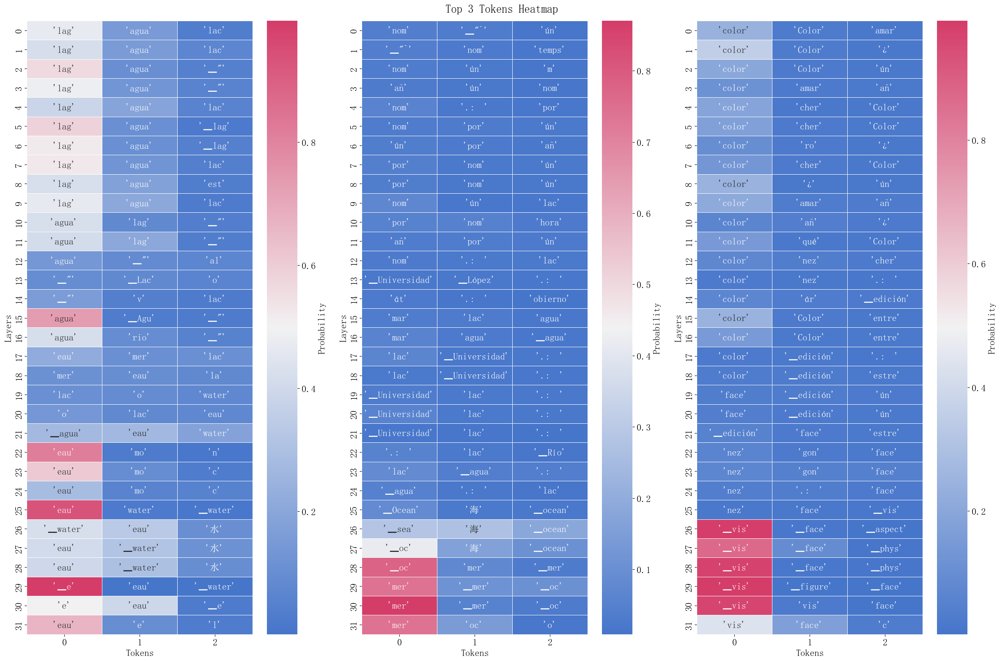

,0,1,2
prompt,"Español: ""verano"" - 中文: ""夏季""\nEspañol: ""bosque"" - 中文: ""林木""\nEspañol: ""té"" - 中文: ""茶""\nEspañol: ""valle"" - 中文: ""溪谷""\nEspañol: ""rojo"" - 中文: ""红色""\nEspañol: ""lago"" - 中文: ""","Español: ""libro"" - 中文: ""書""\nEspañol: ""colegio"" - 中文: ""大學""\nEspañol: ""té"" - 中文: ""茶""\nEspañol: ""nube"" - 中文: ""雲""\nEspañol: ""océano"" - 中文: ""海""\nEspañol: ""día"" - 中文: ""","Español: ""expresión"" - 中文: ""表示式""\nEspañol: ""posición"" - 中文: ""地理位置""\nEspañol: ""lugar"" - 中文: ""附近""\nEspañol: ""libro"" - 中文: ""書""\nEspañol: ""cuadro"" - 中文: ""绘画""\nEspañol: ""rojo"" - 中文: """
target_strings,"[湖, 湖泊]","[日, 太陽日, 太阳日, 一昼夜, 平均太阳日, 民用日, 天, 日历日, 恒星日]","[红色, 紅色]"
es_string,"[lago, lagos, estanque]","[día, día solar]","[rojo, roja, rojez]"
fr_string,[lac],"[jour, jour solaire]",[rouge]
target_tokens,"[湖, lag, ▁l, ▁lag, est, ▁est, lac, ▁lac]","[日, 太, 一, 平, 民, 天, <0xE6>, d, ▁día, j, ▁jour]","[红, <0xE7>, ro, ▁ro, rou, ▁rou]"
es_tokens,"[lag, ▁l, ▁lag, est, ▁est]","[d, ▁día]","[ro, ▁ro]"
fr_tokens,"[lac, ▁lac]","[j, ▁jour]","[rou, ▁rou]"


,0,1,2
prompt,"Deutsch: ""Tag"" - Français: ""jour""\nDeutsch: ""Richter"" - Français: ""juge""\nDeutsch: ""Tuch"" - Français: ""textile""\nDeutsch: ""Pferd"" - Français: ""cheval""\nDeutsch: ""Reis"" - Français: ""riziculteur""\nDeutsch: ""Wasser"" - Français: ""","Deutsch: ""Tag"" - Français: ""jour""\nDeutsch: ""Haus"" - Français: ""domicile""\nDeutsch: ""Sonne"" - Français: ""étoile""\nDeutsch: ""Feder"" - Français: ""plumage""\nDeutsch: ""Zeit"" - Français: ""temps""\nDeutsch: ""Meer"" - Français: ""","Deutsch: ""Höhle"" - Français: ""grotte""\nDeutsch: ""Stamm"" - Français: ""arbre""\nDeutsch: ""Stadt"" - Français: ""agglomération urbaine""\nDeutsch: ""Standort"" - Français: ""localité""\nDeutsch: ""Freund"" - Français: ""camaraderie""\nDeutsch: ""Gesicht"" - Français: """
target_strings,"[eau, eaux, étendue d'eau]",[mer],"[face, figure, visage]"
de_string,"[Wasser, Gewässer]",[Meer],"[Gesicht, Visage, Angesicht, Antlitz]"
es_string,"[agua, cuerpo de agua, extensión de agua, masa de agua]","[mar, océano mundial, océano, mares]","[rostro, cara, jeta, faz, rostro humano]"
target_tokens,"[eau, ▁e, e, ét, ▁ét, W, ▁Wasser, G, ▁Gew, agua, ▁agua, c, ▁cuer, ext, ▁extens, mas, ▁mas]","[mer, ▁mer, Me, ▁Me, mar, ▁mar, oc, ▁oc]","[face, ▁face, figure, ▁figure, vis, ▁vis, G, ▁Ges, Vis, ▁Vis, Ang, ▁An, Ant, ▁Ant, rost, ▁ro, c, ▁car, j, ▁j, f, ▁faz]"
de_tokens,"[W, ▁Wasser, G, ▁Gew]","[Me, ▁Me]","[G, ▁Ges, Vis, ▁Vis, Ang, ▁An, Ant, ▁Ant]"
es_tokens,"[agua, ▁agua, c, ▁cuer, ext, ▁extens, mas, ▁mas]","[mar, ▁mar, oc, ▁oc]","[rost, ▁ro, c, ▁car, j, ▁j, f, ▁faz]"


In [ ]:
patch_skip_probs3 = patch_skip_lens(nn_model, source_prompts, target_prompts, num_skips=5, attn_idx_patch=-7)
plot_topk_tokens(patch_skip_probs3, nn_model, k=3)
display_df(prompts_to_df(source_prompts, tokenizer))
display_df(prompts_to_df(target_prompts, tokenizer))

'Deutsch: "Wald" - Français: "forêt"\nDeutsch: "Straße" - Français: "route"\nDeutsch: "Talent" - Français: "aptitude"\nDeutsch: "tausend" - Français: "mille"\nDeutsch: "Farbe" - Français: "noir"\nDeutsch: "Freund'

/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 8627 (\N{DOWNWARDS ARROW WITH TIP RIGHTWARDS}) missing from current font.
  fig.canvas.draw()
/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 10047 (\N{BLACK FLORETTE}) missing from current font.
  fig.canvas.draw()
/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 1112 (\N{CYRILLIC SMALL LETTER JE}) missing from current font.
  fig.canvas.draw()
/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 10134 (\N{HEAVY MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/dlabscratch1/cdumas/.conda_envs/llmenglish/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 10095 (\N{HEAVY RIGHT-POINTING ANGLE QUOTATION MARK ORNAMENT}) missing from current font.
  fig.canvas.draw(

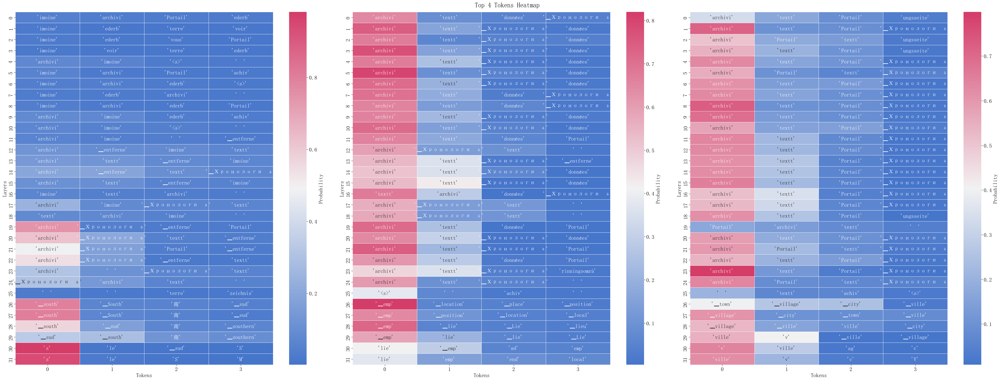

,0,1,2
prompt,"Deutsch: ""Wasser"" - Français: ""eau""\nDeutsch: ""Lied"" - Français: ""chanson""\nDeutsch: ""Gruppe"" - Français: ""ensemble musical""\nDeutsch: ""Norden"" - Français: ""nord""\nDeutsch: ""Krawatte"" - Français: ""cravate""\nDeutsch: ""Süden"" - Français: ""","Deutsch: ""Geschichte"" - Français: ""développement historique""\nDeutsch: ""Turm"" - Français: ""tour""\nDeutsch: ""Wasser"" - Français: ""eau""\nDeutsch: ""Schule"" - Français: ""académie""\nDeutsch: ""Zeit"" - Français: ""temps""\nDeutsch: ""Standort"" - Français: ""","Deutsch: ""Gruppe"" - Français: ""ensemble musical""\nDeutsch: ""Straße"" - Français: ""route""\nDeutsch: ""Krawatte"" - Français: ""cravate""\nDeutsch: ""Rede"" - Français: ""langage parlé""\nDeutsch: ""Dorf"" - Français: ""hameau""\nDeutsch: ""Stadt"" - Français: """
target_strings,"[sud, midi]","[localité, emplacement, position, lieu, position géographique, localisation, situation, habitat, endroit, zone, point]","[agglomération urbaine, métropole, ville, cité, grande-ville, bourgade, bourg]"
de,[Süden],"[Standort, geographische Lage, Platz, Ort, Lage, Habitat, natürlicher Lebensraum, Heimat, Stelle]","[Stadt, Metropole, Großstadt, Weltstadt, Stadtsiedlung, Kleinstadt, Bourg]"


In [ ]:
patch_skip_probs = patch_skip_lens(nn_model, rnd_prompts_skip_str, rnd_prompts_skip_str, num_skips=5)
plot_topk_tokens(patch_skip_probs, nn_model)
display_df(prompts_to_df(rnd_prompts_skip))

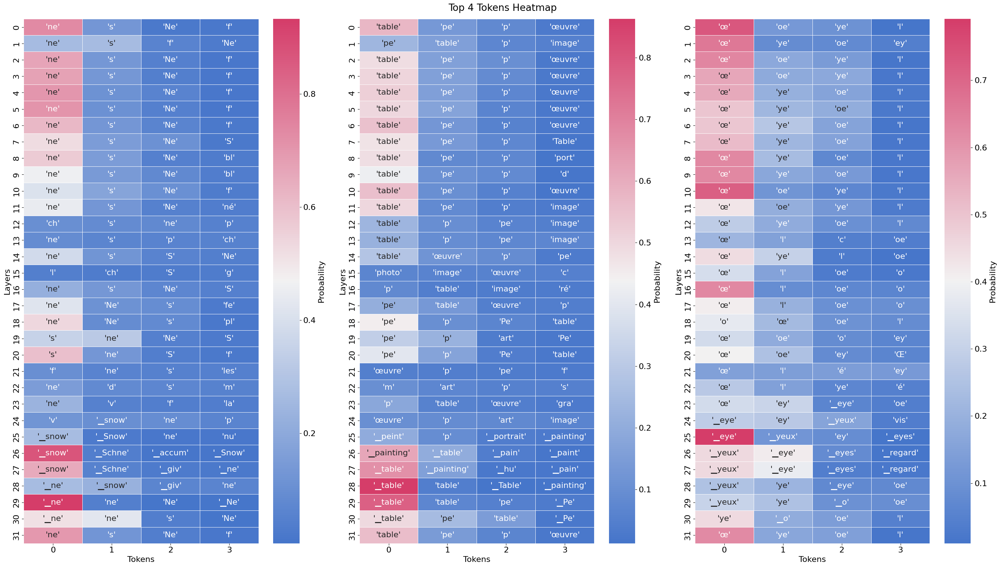

,0,1,2
prompt,"Deutsch: ""Auge"" - Français: ""yeux""\nDeutsch: ""sechs"" - Français: ""six""\nDeutsch: ""Mond"" - Français: ""lune""\nDeutsch: ""Börse"" - Français: ""portefeuille""\nDeutsch: ""Kind"" - Français: ""mineur""\nDeutsch: ""Schnee"" - Français: ""","Deutsch: ""Geschwindigkeit"" - Français: ""vitesse""\nDeutsch: ""Gruppe"" - Français: ""ensemble musical""\nDeutsch: ""Fuß"" - Français: ""pied""\nDeutsch: ""Reis"" - Français: ""riziculteur""\nDeutsch: ""Versuch"" - Français: ""expérience scientifique""\nDeutsch: ""Gemälde"" - Français: ""","Deutsch: ""See"" - Français: ""lac""\nDeutsch: ""Mutter"" - Français: ""maman""\nDeutsch: ""Herz"" - Français: ""cœur""\nDeutsch: ""Stamm"" - Français: ""arbre""\nDeutsch: ""Gold"" - Français: ""or""\nDeutsch: ""Auge"" - Français: """
target_strings,"[neige, couche de neige, chute de neige]","[peinture, artiste peintre, peintre, image, tableau]","[yeux, globe de l'oeil, œil, globe oculaire]"
de,"[Schnee, Schneedecke, Schneefall]","[Gemälde, Abbild, Maler, Darstellung, Malerei]","[Auge, Augapfel, Augen]"


In [ ]:
patch_skip_probs = patch_skip_lens(nn_model, rnd_prompts_skip_str, rnd_prompts_skip_str, num_skips=5)
plot_topk_tokens(patch_skip_probs, nn_model)
display_df(prompts_to_df(rnd_prompts_skip))

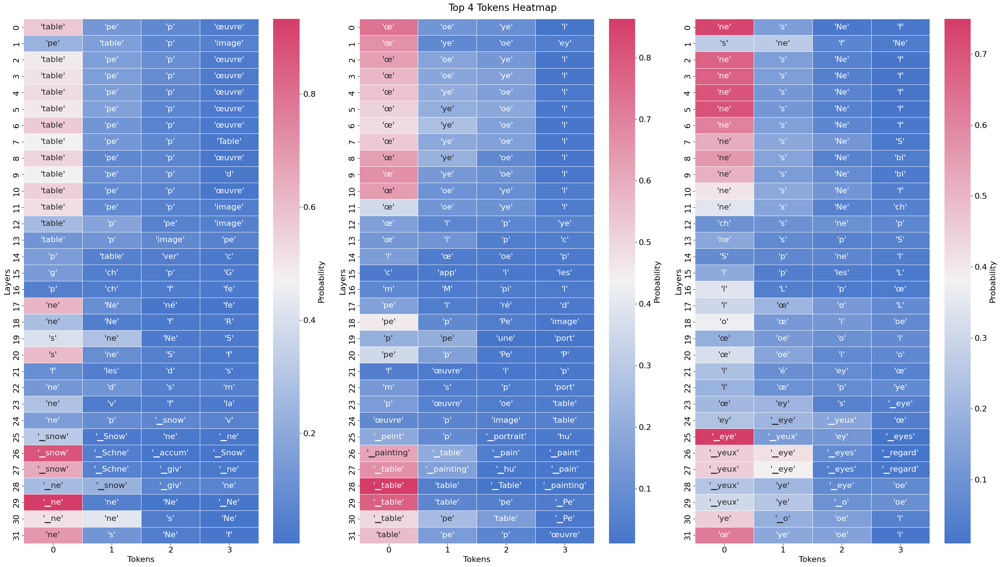

In [ ]:
patch_skip_probs = patch_skip_lens(
    nn_model,
    rnd_prompts_skip_str[1:] + rnd_prompts_skip_str[:1],
    rnd_prompts_skip_str,
    num_skips=5,
)
plot_topk_tokens(patch_skip_probs, nn_model)
# display_df(prompts_to_df(rnd_prompts_skip))

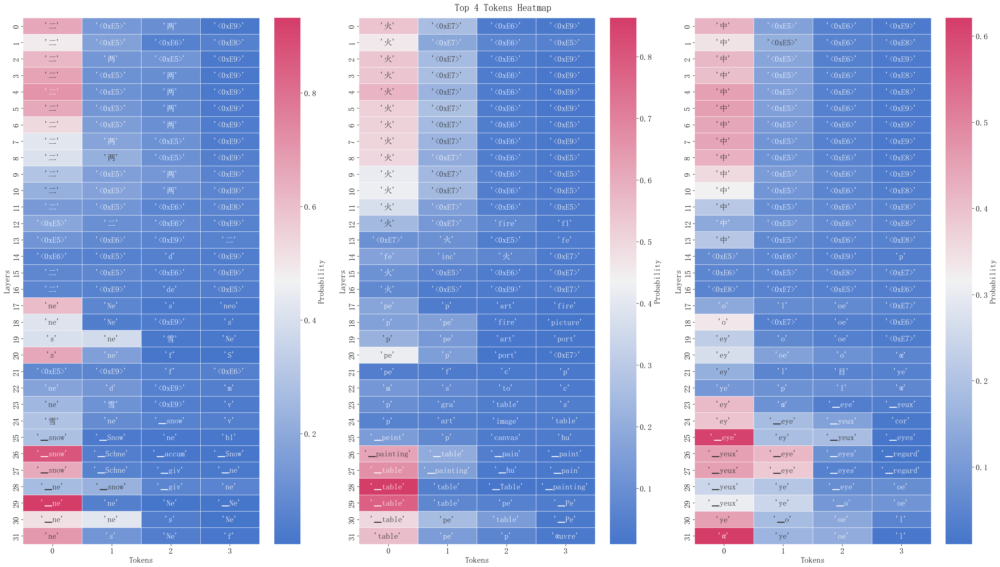

,0,1,2
prompt,"Español: ""pieza"" - 中文: ""铜钱""\nEspañol: ""seis"" - 中文: ""六""\nEspañol: ""puerta"" - 中文: ""戶""\nEspañol: ""torre"" - 中文: ""塔樓""\nEspañol: ""tienda"" - 中文: ""帐篷""\nEspañol: ""dos"" - 中文: ""","Español: ""pie"" - 中文: ""腳""\nEspañol: ""talento"" - 中文: ""结束""\nEspañol: ""expresión"" - 中文: ""表示式""\nEspañol: ""pelo"" - 中文: ""发丝""\nEspañol: ""boca"" - 中文: ""入口""\nEspañol: ""fuego"" - 中文: ""","Español: ""sol"" - 中文: ""日头""\nEspañol: ""primavera"" - 中文: ""春天""\nEspañol: ""sección"" - 中文: ""表面積""\nEspañol: ""pie"" - 中文: ""腳""\nEspañol: ""piedra"" - 中文: ""小石頭""\nEspañol: ""medio"" - 中文: """
target_strings,"[一, 貳, 二, 贰, 两, 兩]","[火, 火焰, 焚烧, 燃烧, 火舌, 焰, 燈, 灯, 点火器, 打火机, 打火機, 火灾, 火災]","[传播媒体, 傳播媒體, 新聞媒體, 新闻媒体, 半, 一半, 二分之一, 传送器, 中间, 中心, 中心点, 中央, 方法, 方式, 办法, 手段]"
es,"[dos, uno, es]","[fuego, llama, flama, lumbre, incendio, encendedor, lámpara, luminaria, mechero, yesquero, briquet]","[medio, medio de comunicación, Medio informativo, prensa, medios de comunicación, periodismo, medios periodísticos, mitad, un medio, metad, transporte, transporte de pasajeros, medio de transporte, centro, corazón, ojo, modo, manera, forma, camino]"


In [ ]:
tr_df2 = get_bn_dataset("es", "zh")
prompts_es_zh = filter_prompts(translation_prompts(tr_df2, nn_model.tokenizer, "es", "zh", "es", augment_tokens=False))
source_prompts = sample(prompts_es_zh, 3)
source_prompts = prompts_to_str(source_prompts)
patch_skip_probs3 = patch_skip_lens(nn_model, source_prompts, rnd_prompts_skip_str, num_skips=5)
plot_topk_tokens(patch_skip_probs3, nn_model)
display_df(prompts_to_df(source_prompts))

## Patch attention experiment

In [6]:
from interventions import patch_object_attn_lens

In [7]:
es_df = get_bn_dataset("es", ["zh", "fr"])
prompts_es_zh = filter_prompts(translation_prompts(es_df, nn_model.tokenizer, "es", "zh", ["es", "fr"], augment_tokens=False))
de_df = get_bn_dataset("de", ["es", "fr"])
prompts_de_fr = filter_prompts(translation_prompts(de_df, nn_model.tokenizer, "de", "fr", ["de", "es"], augment_tokens=False))
target_prompts = sample(prompts_de_fr, 3)
source_prompts = sample( prompts_es_zh, 3)
source_prompts_str = ['"'.join(s.split('"')[:-2]) for s in prompts_to_str(source_prompts)]
fake_source_prompts_str = ['"'.join(s.split('"')[:-2]) for s in prompts_to_str(target_prompts)]

In [ ]:
import cProfile
from pstats import Stats
cProfile.run("patch_object_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7)", "prof")
stats = Stats("prof")
stats.strip_dirs().sort_stats("cumulative").print_stats(20)

Mon May 27 03:45:09 2024    prof

         170914840 function calls (163058014 primitive calls) in 147.263 seconds

   Ordered by: cumulative time
   List reduced from 809 to 20 due to restriction <20>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000  151.849  151.849 {built-in method builtins.exec}
        1    0.002    0.002  151.849  151.849 <string>:1(<module>)
        1    0.051    0.051  151.846  151.846 interventions.py:381(patch_object_lens)
      193    0.001    0.000  146.728    0.760 Generation.py:13(_execute)
      193    0.003    0.000  146.728    0.760 LanguageModel.py:280(_execute_forward)
87429/193    0.131    0.000  146.455    0.759 module.py:1507(_wrapped_call_impl)
87429/193    0.653    0.000  146.455    0.759 module.py:1513(_call_impl)
      193    0.004    0.000  146.451    0.759 modeling_llama.py:1116(forward)
      193    0.037    0.000  146.028    0.757 modeling_llama.py:892(forward)
     6176    0.197    0.000

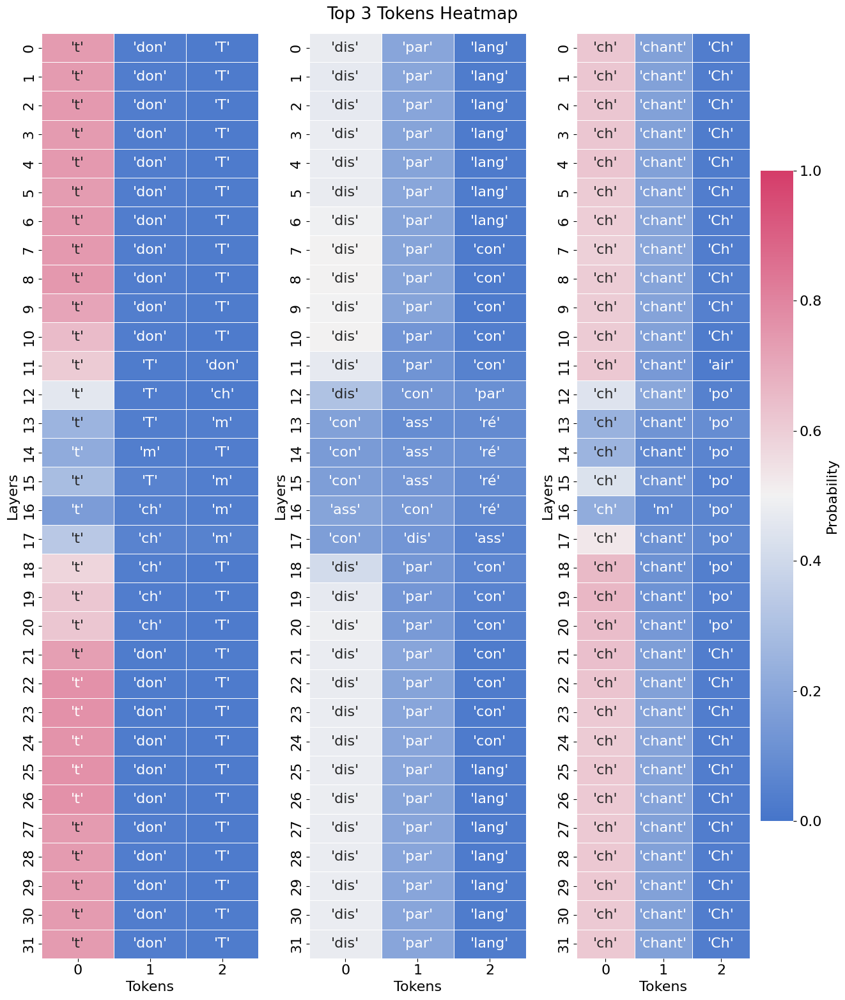

In [ ]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7), tokenizer, k=3)

In [ ]:
display_df(prompts_to_df(source_prompts, tokenizer))
display_df(prompts_to_df(target_prompts, tokenizer))

,0,1,2
prompt,"Español: ""grupo"" - 中文: ""流行樂團""\nEspañol: ""rabo"" - 中文: ""尾巴""\nEspañol: ""fuego"" - 中文: ""火""\nEspañol: ""ojo"" - 中文: ""眼睛""\nEspañol: ""generación"" - 中文: ""輩""\nEspañol: ""ola"" - 中文: ""","Español: ""tipo"" - 中文: ""類""\nEspañol: ""torre"" - 中文: ""塔樓""\nEspañol: ""tierra"" - 中文: ""地球""\nEspañol: ""funcionario"" - 中文: ""官員""\nEspañol: ""agua"" - 中文: ""水""\nEspañol: ""rojo"" - 中文: ""","Español: ""sección"" - 中文: ""表面積""\nEspañol: ""boca"" - 中文: ""入口""\nEspañol: ""montaña"" - 中文: ""山""\nEspañol: ""sol"" - 中文: ""日头""\nEspañol: ""lago"" - 中文: ""湖""\nEspañol: ""madera"" - 中文: """
target_strings,"[海浪, 波濤, 波, 波浪]","[红色, 紅色]","[木头, 木, 木材, 木料, 木頭]"
es_string,"[ola, ola marina, onda]","[rojo, roja, rojez]","[madera, albura, sámago]"
fr_string,"[vague, onde]",[rouge],"[aubier, bois]"
target_tokens,"[海, 波, ola, ▁o, onda, ▁on, v, ▁vague, onde, ▁onde]","[红, <0xE7>, ro, ▁ro, rou, ▁rou]","[木, mad, ▁mad, al, ▁alb, s, ▁s, a, ▁a, bo, ▁bois]"
es_tokens,"[ola, ▁o, onda, ▁on]","[ro, ▁ro]","[mad, ▁mad, al, ▁alb, s, ▁s]"
fr_tokens,"[v, ▁vague, onde, ▁onde]","[rou, ▁rou]","[a, ▁a, bo, ▁bois]"


,0,1,2
prompt,"Deutsch: ""Maschine"" - Français: ""aéroplane""\nDeutsch: ""Auge"" - Français: ""yeux""\nDeutsch: ""Mutter"" - Français: ""maman""\nDeutsch: ""Licht"" - Français: ""lumière""\nDeutsch: ""Börse"" - Français: ""portefeuille""\nDeutsch: ""Tür"" - Français: ""","Deutsch: ""Plattform"" - Français: ""quai""\nDeutsch: ""tausend"" - Français: ""mille""\nDeutsch: ""Norden"" - Français: ""nord""\nDeutsch: ""Stamm"" - Français: ""arbre""\nDeutsch: ""Versuch"" - Français: ""expérience scientifique""\nDeutsch: ""Tag"" - Français: ""","Deutsch: ""Plattform"" - Français: ""quai""\nDeutsch: ""Osten"" - Français: ""levant""\nDeutsch: ""Haus"" - Français: ""domicile""\nDeutsch: ""Standort"" - Français: ""localité""\nDeutsch: ""Feuer"" - Français: ""flamme""\nDeutsch: ""Gold"" - Français: """
target_strings,"[encadrement de porte, porte, portière, huis]","[jour, jour solaire]","[or, ambre]"
de_string,"[Tür, Türfutter, Türrahmen, Tor, Türzarge, Türen, Türe]","[Tag, Solartag, Sonnentag]","[Gold, Bernsteinfarben]"
es_string,"[puerta, marco de puerta, seguro]","[día, día solar]","[oro, ámbar, dorado]"
target_tokens,"[enc, ▁enc, porte, ▁porte, port, ▁port, h, ▁h, T, ▁Tür, ▁Tor, ▁T, pu, ▁pu, mar, ▁mar, seg, ▁seg]","[j, ▁jour, Tag, ▁Tag, Sol, ▁Sol, S, ▁S, d, ▁día]","[or, ▁or, am, ▁am, G, ▁Gold, B, ▁Bern, oro, ▁oro, ám, ▁á, dor, ▁dor]"
de_tokens,"[T, ▁Tür, ▁Tor, ▁T]","[Tag, ▁Tag, Sol, ▁Sol, S, ▁S]","[G, ▁Gold, B, ▁Bern]"
es_tokens,"[pu, ▁pu, mar, ▁mar, seg, ▁seg]","[d, ▁día]","[oro, ▁oro, ám, ▁á, dor, ▁dor]"


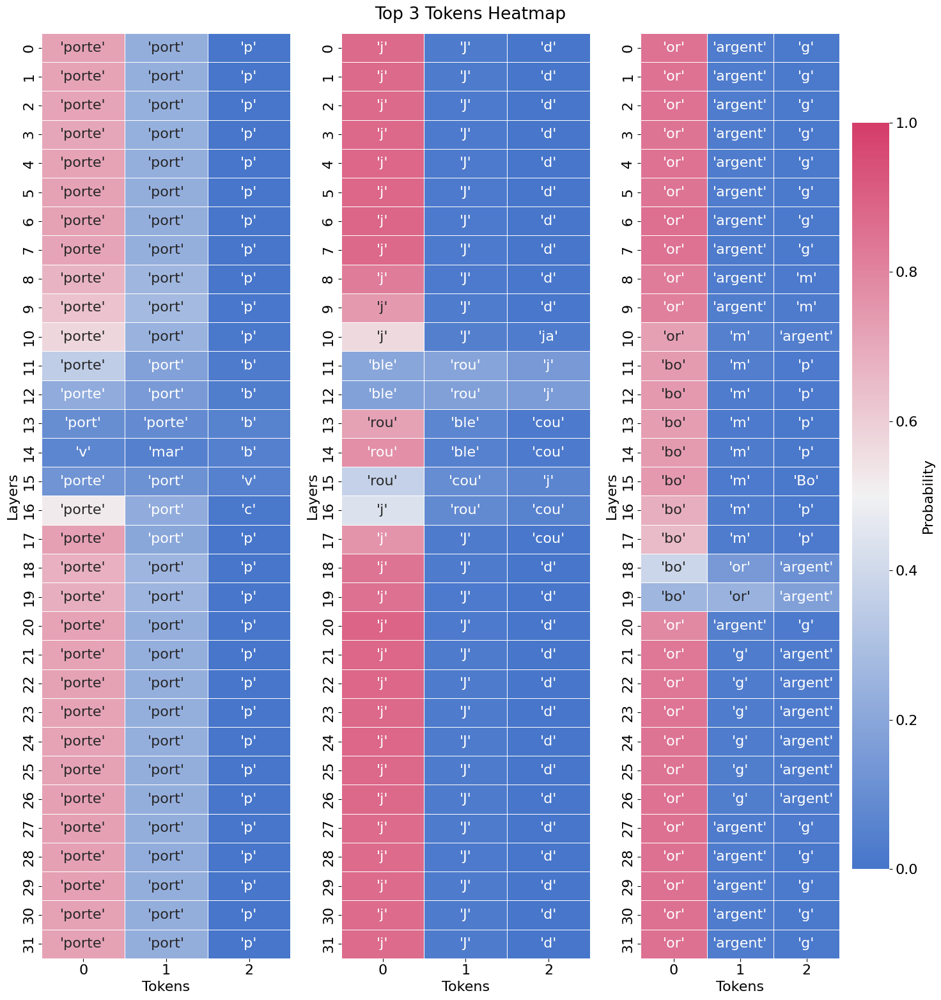

In [ ]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=7), tokenizer, k=3)

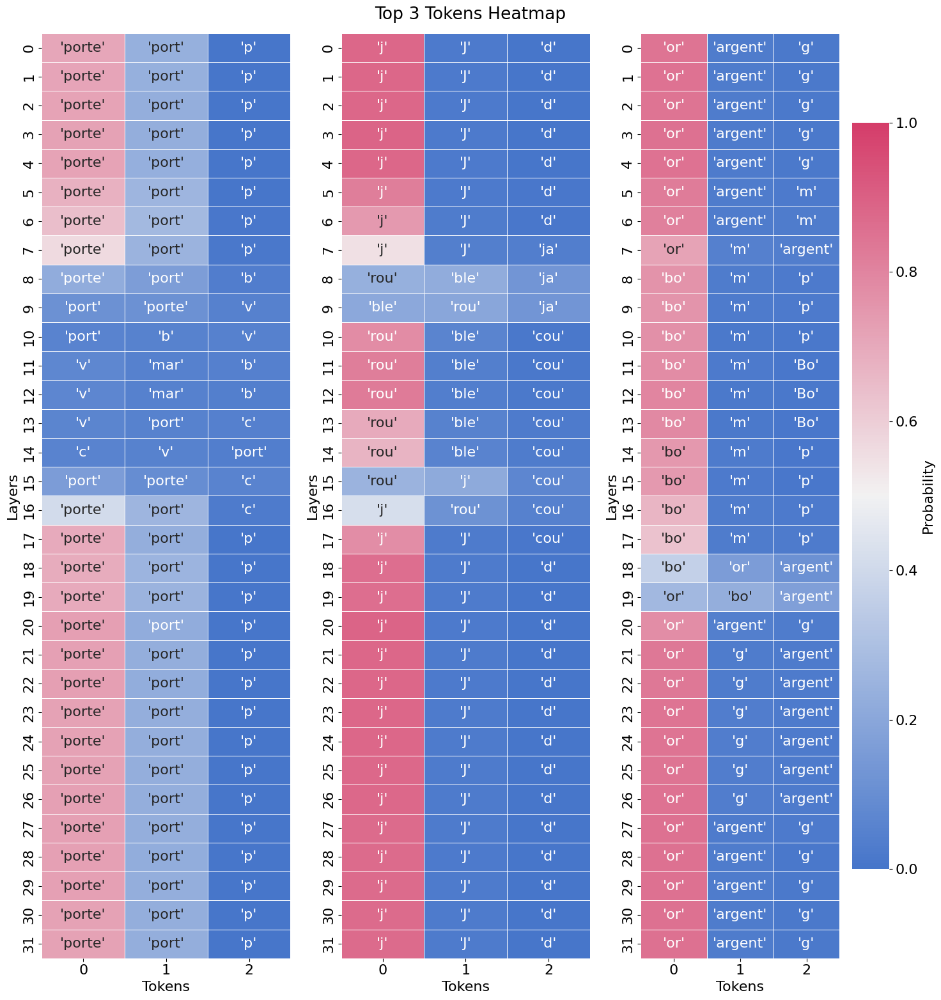

In [ ]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=10), tokenizer, k=3)

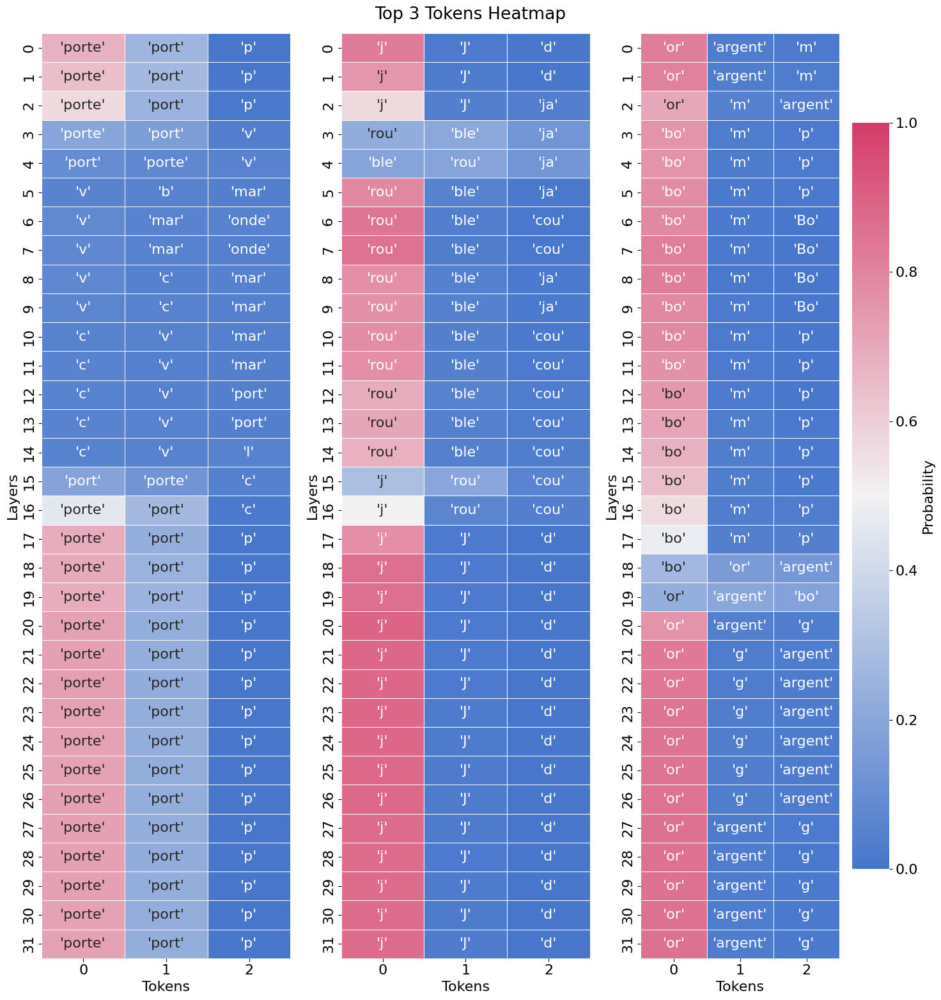

In [ ]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=15), tokenizer, k=3)

We detected that you are passing `past_key_values` as a tuple and this is deprecated and will be removed in v4.43. Please use an appropriate `Cache` class (https://huggingface.co/docs/transformers/v4.41.3/en/internal/generation_utils#transformers.Cache)
You're using a LlamaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


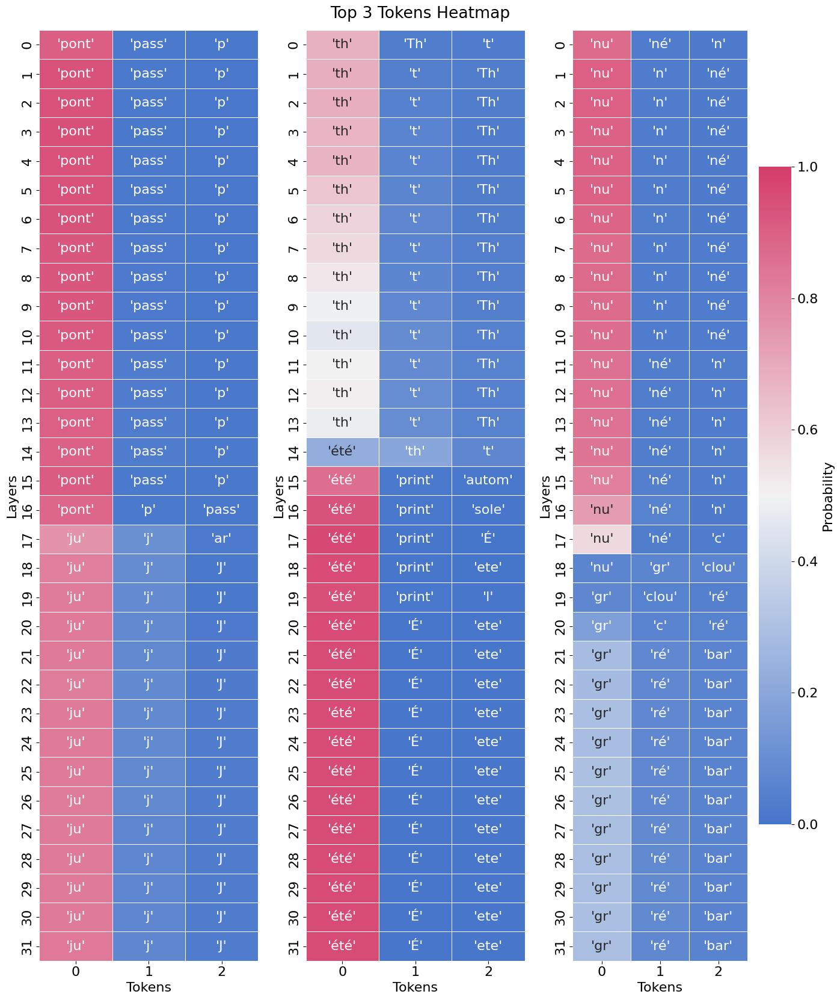

In [8]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=20), tokenizer, k=3)

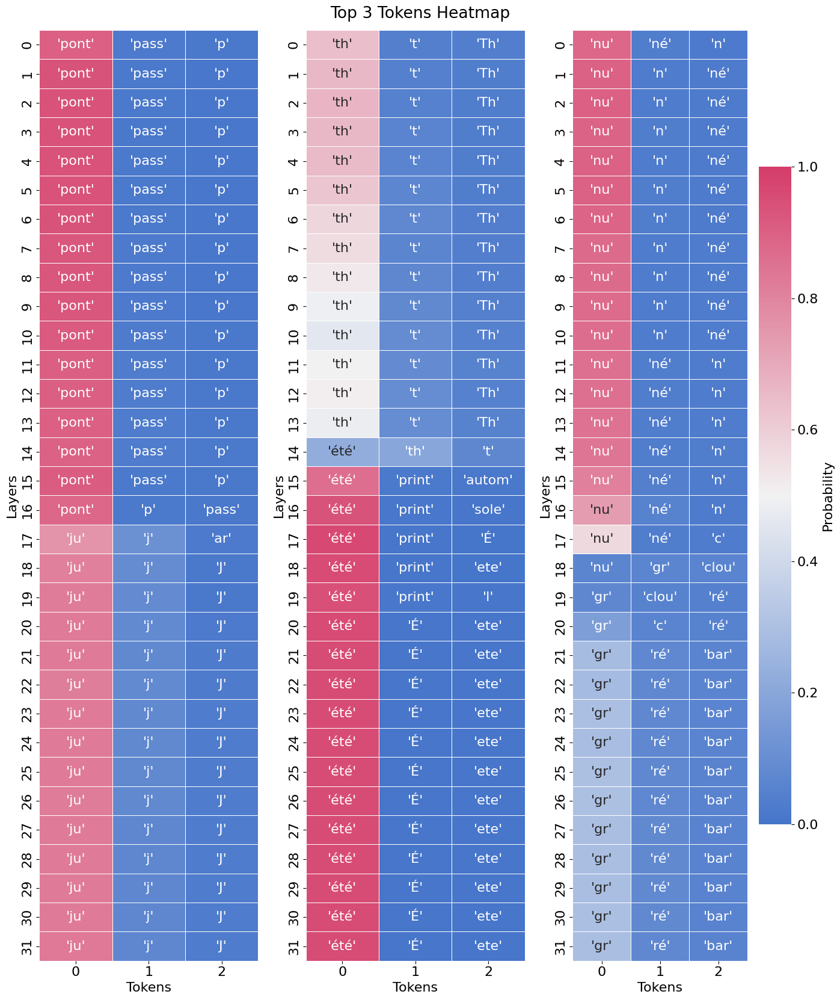

In [9]:
from interventions import patch_object_attn_lens2
plot_topk_tokens(patch_object_attn_lens2(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=20), tokenizer, k=3)

In [11]:
probs1 = patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=100) 
probs2 = patch_object_attn_lens2(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=100)


RuntimeError: [enforce fail at alloc_cpu.cpp:117] err == 0. DefaultCPUAllocator: can't allocate memory: you tried to allocate 983040000000 bytes. Error code 12 (Cannot allocate memory)

In [15]:
diff = (probs1 - probs2).abs().max()
# diff_top5 = (probs1 - probs2)[probs1.argsort()[:, -5:]].abs().mean()
print(f"{diff.item(): .100f}")

 0.0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000


: 

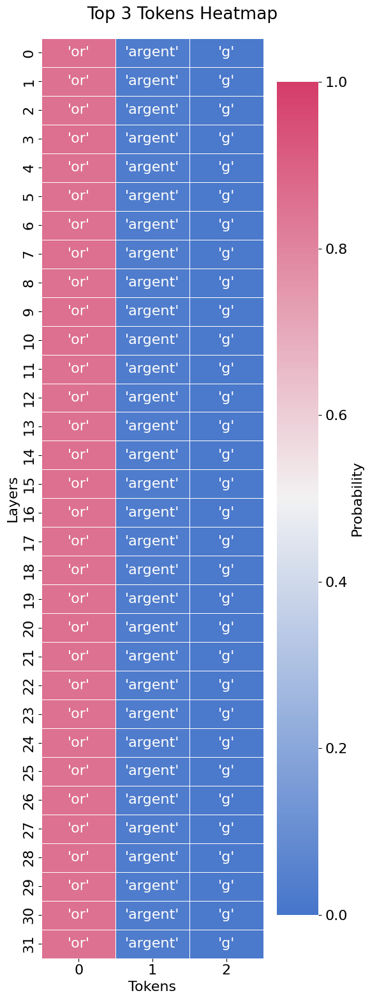

In [ ]:
plot_topk_tokens(patch_object_attn_lens(nn_model, fake_source_prompts_str[2], prompts_to_str(target_prompts)[2], -7), tokenizer, k=3)

/mnt/dlabscratch1/cdumas/llm-latent-language/generalization/../utils.py:487: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


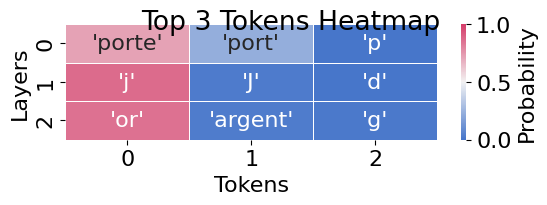

In [ ]:
plot_topk_tokens(next_token_probs(nn_model, prompts_to_str(target_prompts)), tokenizer, k=3)

In [ ]:
tokenizer.encode("aaaa a aa  a", add_special_tokens=False), tokenizer("aaaa a aa  a").input_ids

([27137, 263, 29099, 29871, 263], [1, 27137, 263, 29099, 29871, 263])

In [9]:
from nnsight_utils import get_layer_output, get_num_layers, get_next_token_probs


def object_hidden_patching(nn_model, source_prompts, target_prompts, idx, num_patchs=5):
    if isinstance(target_prompts, str):
        target_prompts = [target_prompts]
    num_layers = get_num_layers(nn_model)
    hiddens = collect_activations(
        nn_model,
        source_prompts,
    )
    probs_l = []
    for layer in range(num_layers):
        with nn_model.trace(target_prompts):
            for target_layer in range(layer, min(layer + num_patchs, num_layers)):
                get_layer_output(nn_model, target_layer)[:, idx] = hiddens[target_layer]
            probs = get_next_token_probs(nn_model).cpu().save()
            probs_l.append(probs)
    return (
        th.cat(probs_l, dim=0)
        .reshape(num_layers, len(target_prompts), -1)
        .transpose(0, 1)
    )



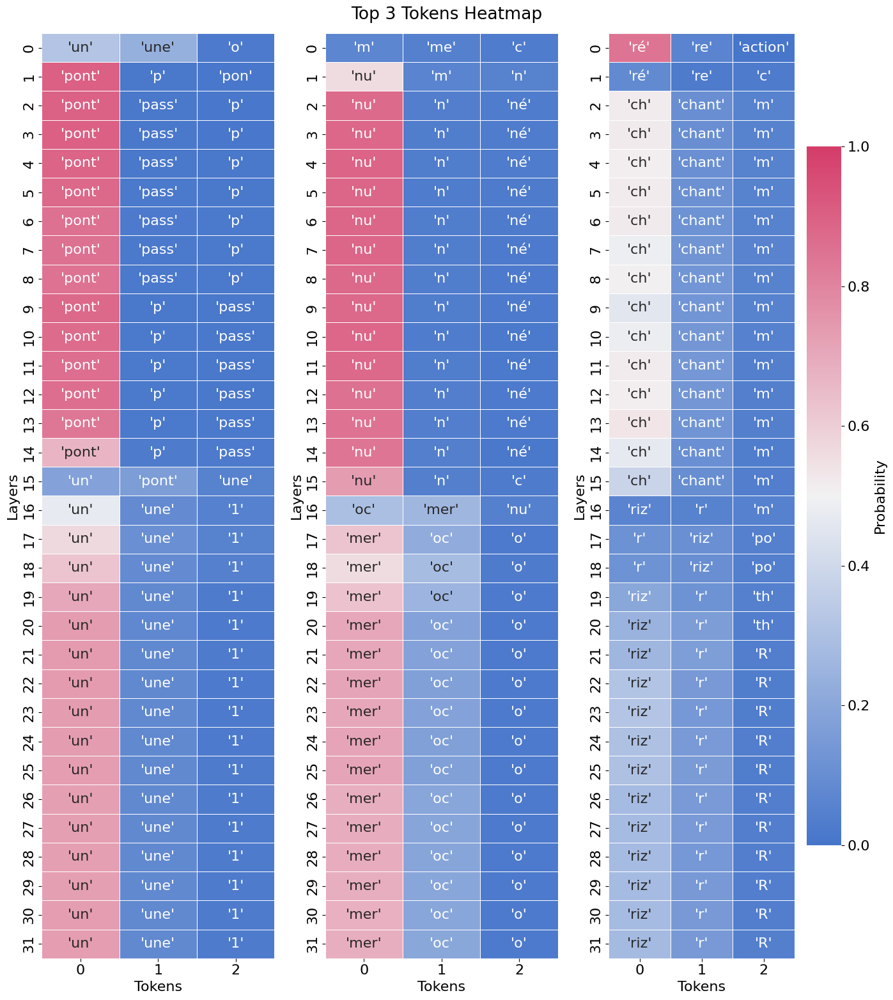

In [50]:
plot_topk_tokens(object_hidden_patching(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patchs=1), tokenizer, k=3)

You're using a LlamaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


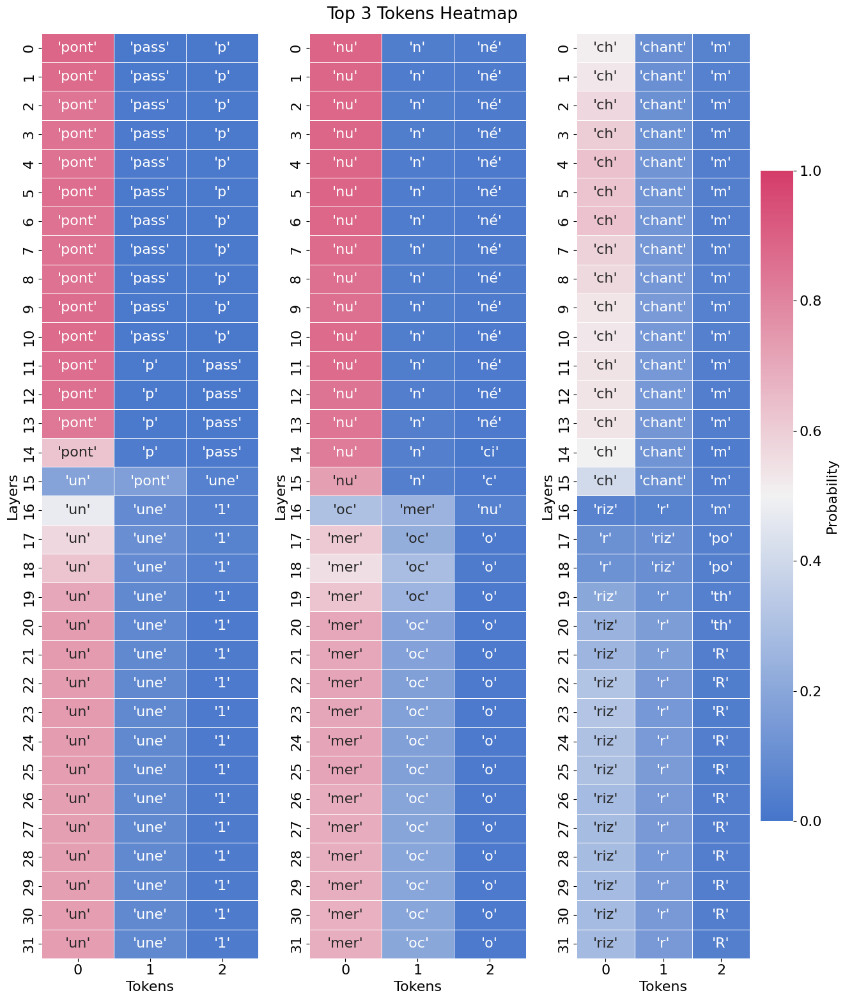

In [10]:
plot_topk_tokens(object_hidden_patching(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7), tokenizer, k=3)

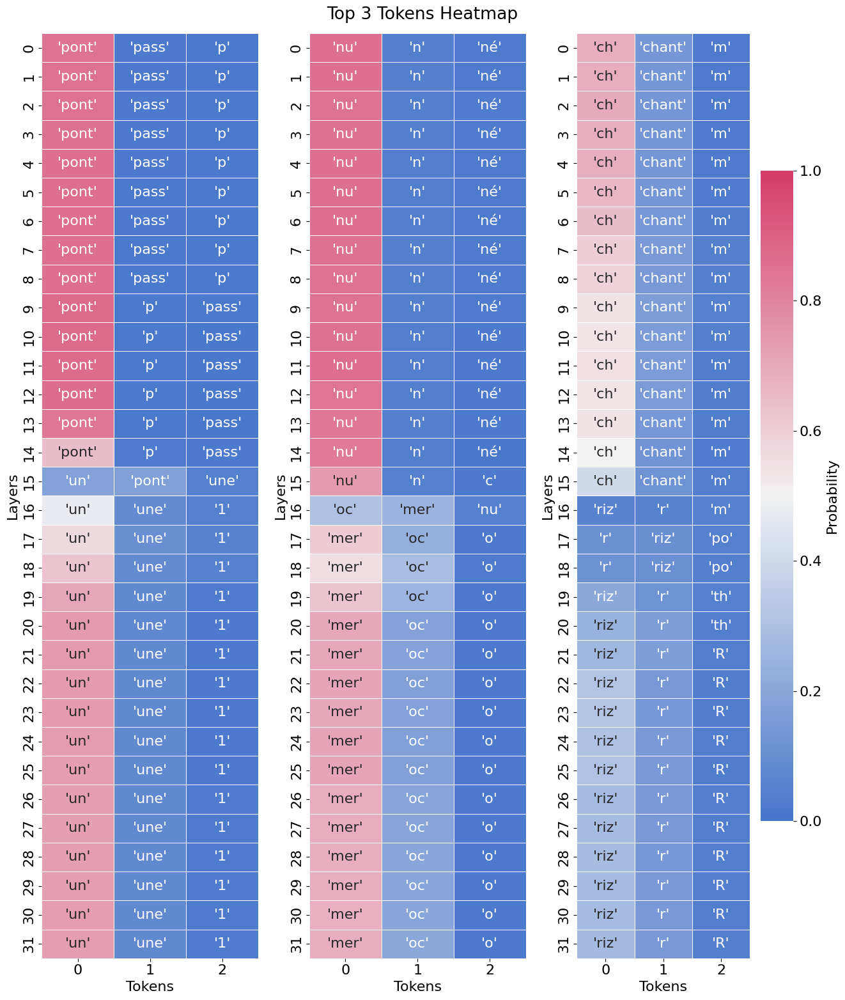

In [53]:
plot_topk_tokens(object_hidden_patching(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patchs=60), tokenizer, k=3)

In [13]:
display_df(prompts_to_df(source_prompts, tokenizer))
display_df(prompts_to_df(target_prompts, tokenizer))

,0,1,2
prompt,"Español: ""reunión"" - 中文: ""會議""\nEspañol: ""oficina"" - 中文: ""辦公室""\nEspañol: ""palabra"" - 中文: ""詞""\nEspañol: ""primavera"" - 中文: ""春天""\nEspañol: ""mano"" - 中文: ""手""\nEspañol: ""puente"" - 中文: ""","Español: ""sección"" - 中文: ""表面積""\nEspañol: ""uno"" - 中文: ""一""\nEspañol: ""fuego"" - 中文: ""火""\nEspañol: ""seis"" - 中文: ""六""\nEspañol: ""caballo"" - 中文: ""馬""\nEspañol: ""nube"" - 中文: ""","Español: ""bailar"" - 中文: ""舞蹈""\nEspañol: ""valle"" - 中文: ""溪谷""\nEspañol: ""puerta"" - 中文: ""戶""\nEspañol: ""cinco"" - 中文: ""四""\nEspañol: ""tierra"" - 中文: ""地球""\nEspañol: ""canción"" - 中文: """
target_strings,"[橋, 桥, 桥梁]","[雲, 云]","[歌, 歌曲]"
es_string,"[puente, bóveda]","[nube, nubes]","[canción, vocal]"
fr_string,"[pont, liste de ponts romains, passerelle]",[nuage],[chanson]
target_tokens,"[橋, 桥, pu, ▁pu, b, ▁b, pont, ▁pont, l, ▁liste, pass, ▁passer]","[雲, 云, n, ▁n, nu, ▁nu]","[歌, can, ▁canción, v, ▁vocal, ch, ▁chanson]"
es_tokens,"[pu, ▁pu, b, ▁b]","[n, ▁n]","[can, ▁canción, v, ▁vocal]"
fr_tokens,"[pont, ▁pont, l, ▁liste, pass, ▁passer]","[nu, ▁nu]","[ch, ▁chanson]"


,0,1,2
prompt,"Deutsch: ""Ball"" - Français: ""ballon""\nDeutsch: ""zehn"" - Français: ""dix""\nDeutsch: ""Freund"" - Français: ""camaraderie""\nDeutsch: ""Herz"" - Français: ""cœur""\nDeutsch: ""Maschine"" - Français: ""aéroplane""\nDeutsch: ""eins"" - Français: ""","Deutsch: ""Quadrat"" - Français: ""carré""\nDeutsch: ""Fluss"" - Français: ""rivière""\nDeutsch: ""Dorf"" - Français: ""hameau""\nDeutsch: ""Boden"" - Français: ""territoire""\nDeutsch: ""Stern"" - Français: ""étoile""\nDeutsch: ""Meer"" - Français: ""","Deutsch: ""Börse"" - Français: ""portefeuille""\nDeutsch: ""Farbe"" - Français: ""noir""\nDeutsch: ""Lied"" - Français: ""chanson""\nDeutsch: ""Gemälde"" - Français: ""peinture""\nDeutsch: ""Gold"" - Français: ""or""\nDeutsch: ""Reis"" - Français: """
target_strings,"[un, Un]",[mer],"[riziculteur, riz, riz paddy]"
de_string,"[eins, ein]",[Meer],[Reis]
es_string,"[uno, es, dos]","[mar, océano mundial, océano, mares]",[arroz]
target_tokens,"[un, ▁un, Un, ▁Un, e, ▁ein, ein, uno, ▁uno, es, ▁es, d, ▁dos]","[mer, ▁mer, Me, ▁Me, mar, ▁mar, oc, ▁oc]","[riz, ▁r, Re, ▁Re, ar, ▁ar]"
de_tokens,"[e, ▁ein, ein]","[Me, ▁Me]","[Re, ▁Re]"
es_tokens,"[uno, ▁uno, es, ▁es, d, ▁dos]","[mar, ▁mar, oc, ▁oc]","[ar, ▁ar]"


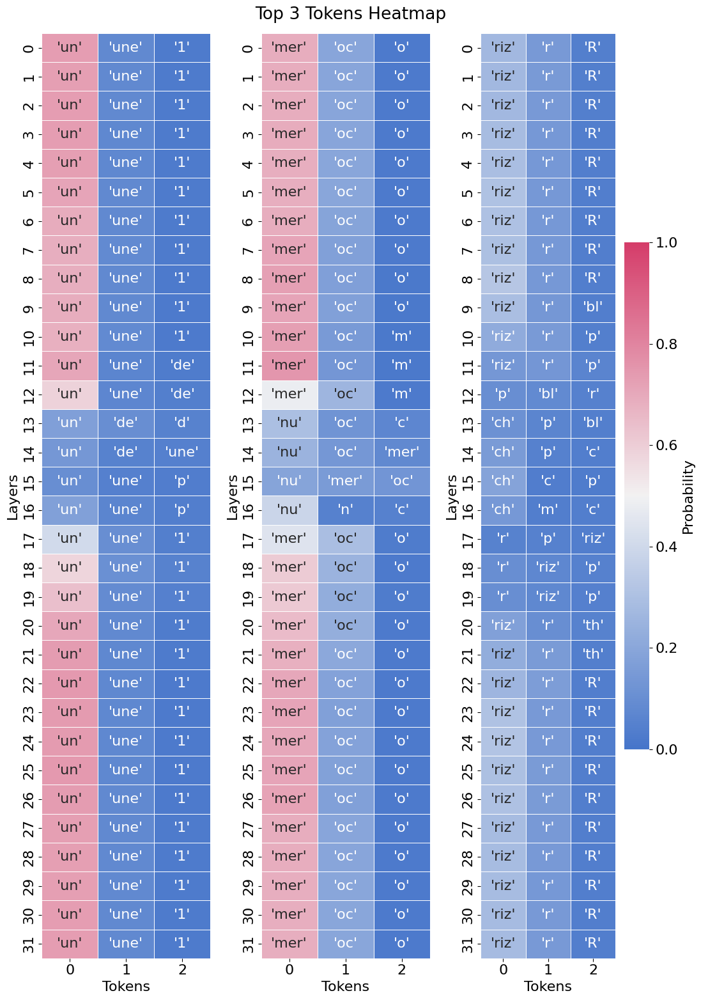

In [14]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7), tokenizer, k=3)

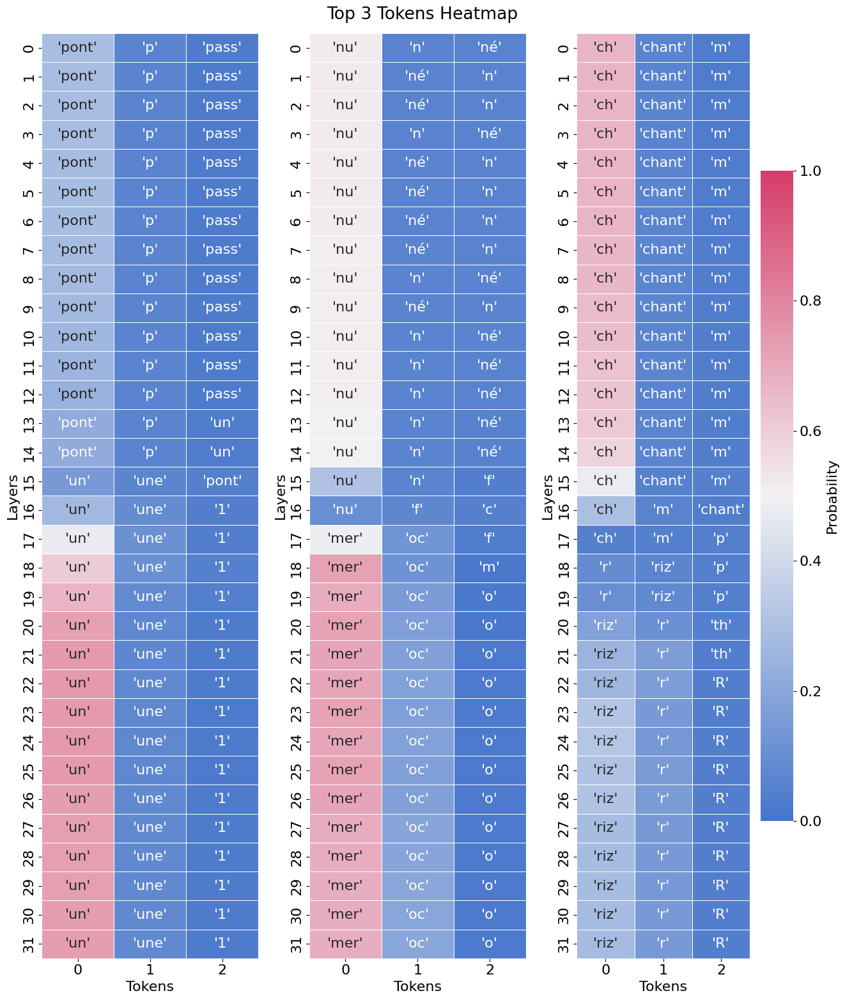

In [51]:
plot_topk_tokens(patch_object_attn_lens(nn_model, source_prompts_str, prompts_to_str(target_prompts), -7, num_patches=60), tokenizer, k=3)

In [ ]:
from nnsight_utils import get_layer_output, get_num_layers, get_next_token_probs


def object_hidden_patching_stop(
    nn_model, source_prompts, target_prompts, idx, num_patchs=5
):
    if isinstance(target_prompts, str):
        target_prompts = [target_prompts]
    num_layers = get_num_layers(nn_model)
    hiddens = collect_activations(
        nn_model,
        source_prompts,
    )
    probs_l = []
    clean_hiddens = collect_activations(
        nn_model,
        target_prompts,
    )
    for layer in range(num_layers):
        with nn_model.trace(target_prompts):
            for target_layer in range(layer, min(layer + num_patchs, num_layers)):
                get_layer_output(nn_model, target_layer)[:, idx] = hiddens[target_layer]
            if layer + num_patchs + 1 < num_layers:
                get_layer_output(nn_model, layer + num_patchs + 1)[:, idx] = (
                    clean_hiddens[layer + num_patchs + 1]
                )
            probs = get_next_token_probs(nn_model).cpu().save()
            probs_l.append(probs)
    return (
        th.cat(probs_l, dim=0)
        .reshape(num_layers, len(target_prompts), -1)
        .transpose(0, 1)
    )

## Language identification

In [43]:
from exp_tools import TargetPrompt
identify_language = TargetPrompt('''"torre": "es"
"Zeit": "de"
"cloud": "en"
"océan": "fr"
"_": "''', -3)

repeat_prompt = TargetPrompt('''"torre": "torre"
"Zeit": "Zeit"
"cloud": "cloud"
"océan": "océan"
"_": "''', -3)


identify_language2 = TargetPrompt('''torre es
Zeit de
cloud en
océan fr
_''', -1)


identify_language3 = TargetPrompt('''torre: es
Zeit: de
cloud: en
océan: fr
_:''', -1)

identify_language4 = TargetPrompt('''torre: es
Zeit: de
cloud: en
océan: fr
_:''', -2)

In [16]:
print('\u4e00\u5bb6\u4eba')

一家人


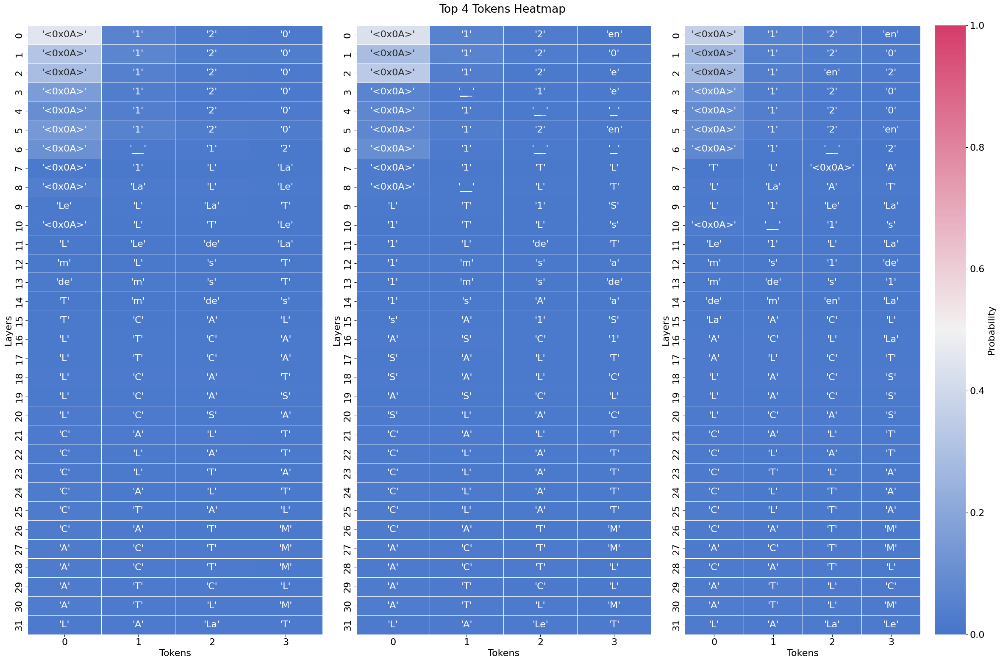

In [30]:
from exp_tools import patch_attention_lens
plot_topk_tokens(patch_attention_lens(nn_model, source_prompts_str, identify_language2), tokenizer)
# source_prompts_str[0]

In [33]:
source_prompts_str

['Español: "reunión" - 中文: "會議"\nEspañol: "oficina" - 中文: "辦公室"\nEspañol: "palabra" - 中文: "詞"\nEspañol: "primavera" - 中文: "春天"\nEspañol: "mano" - 中文: "手"\nEspañol: "puente',
 'Español: "sección" - 中文: "表面積"\nEspañol: "uno" - 中文: "一"\nEspañol: "fuego" - 中文: "火"\nEspañol: "seis" - 中文: "六"\nEspañol: "caballo" - 中文: "馬"\nEspañol: "nube',
 'Español: "bailar" - 中文: "舞蹈"\nEspañol: "valle" - 中文: "溪谷"\nEspañol: "puerta" - 中文: "戶"\nEspañol: "cinco" - 中文: "四"\nEspañol: "tierra" - 中文: "地球"\nEspañol: "canción']

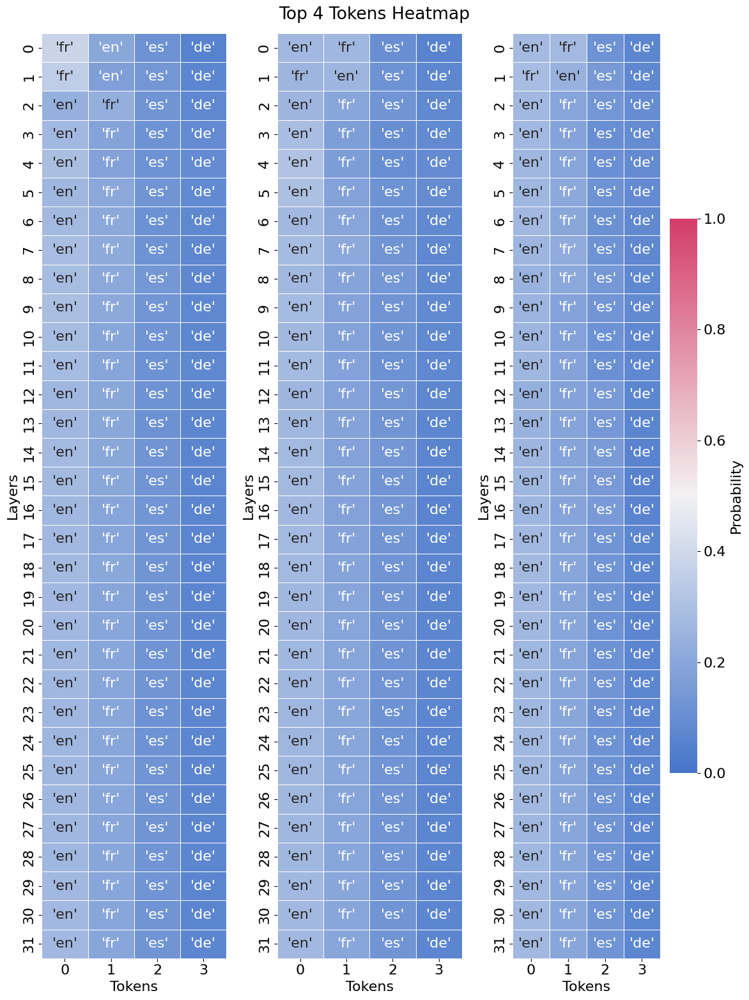

In [32]:
from exp_tools import patch_attention_lens
plot_topk_tokens(patch_attention_lens(nn_model, source_prompts_str, identify_language), tokenizer)
# source_prompts_str[0]

In [39]:
tokenizer.convert_ids_to_tokens(tokenizer.encode(identify_language.prompt, add_special_tokens=False)[-3])

'_'

/mnt/dlabscratch1/cdumas/llm-latent-language/generalization/../utils.py:487: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


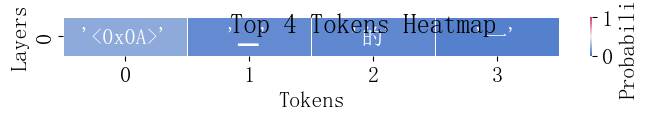

In [31]:
plot_topk_tokens(next_token_probs(nn_model, '''torre es
Zeit de
cloud en
océan fr
一家人'''), tokenizer)

/mnt/dlabscratch1/cdumas/llm-latent-language/generalization/../utils.py:487: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


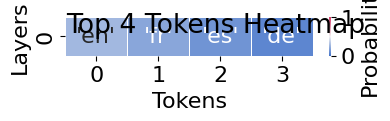

In [34]:
plot_topk_tokens(next_token_probs(nn_model, '''"torre": "es"
"Zeit": "de"
"cloud": "en"
"océan": "fr"
"_": "'''), tokenizer)

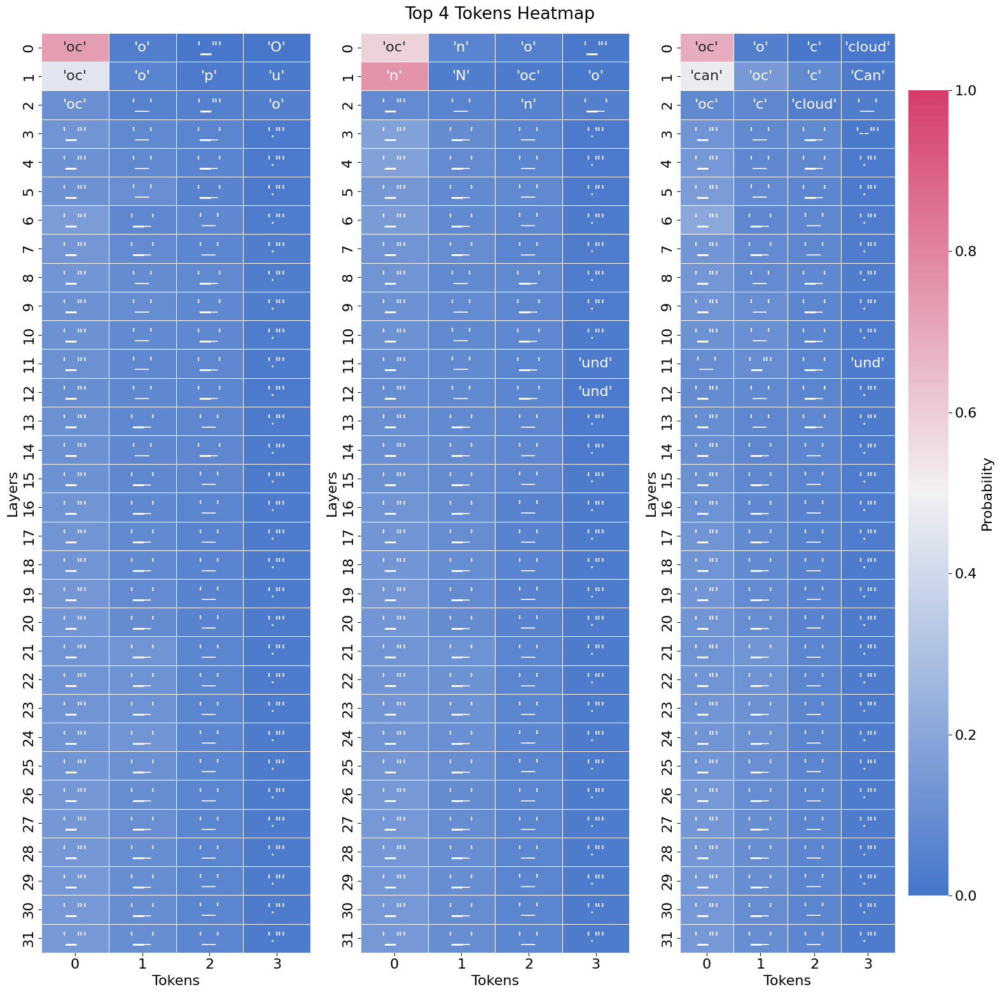

In [36]:
plot_topk_tokens(patch_attention_lens(nn_model, source_prompts_str, repeat_prompt), tokenizer)

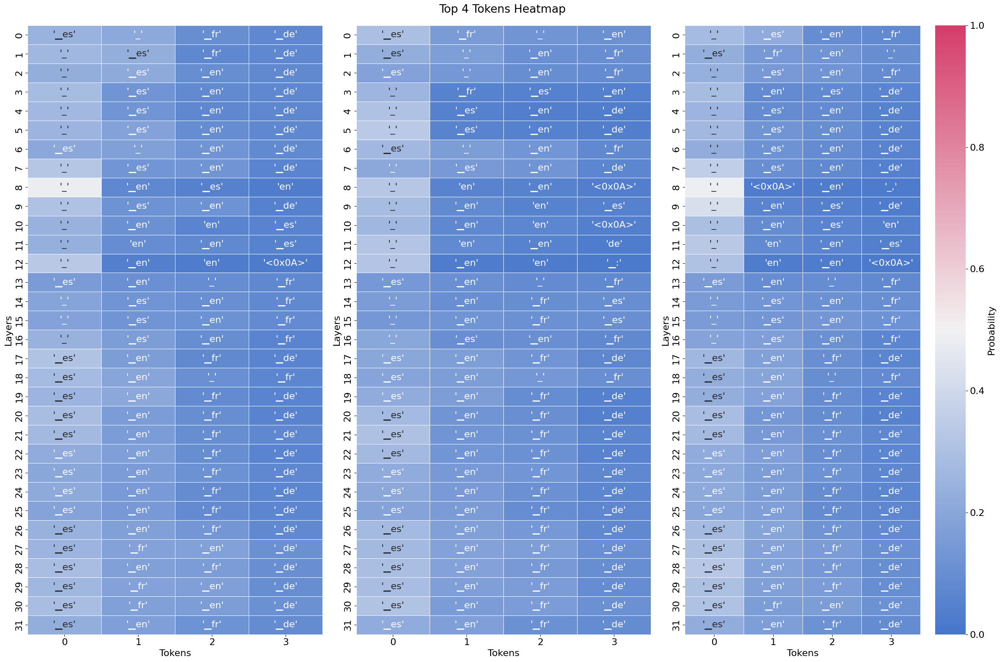

In [41]:
plot_topk_tokens(patch_attention_lens(nn_model, source_prompts_str, identify_language3), tokenizer)

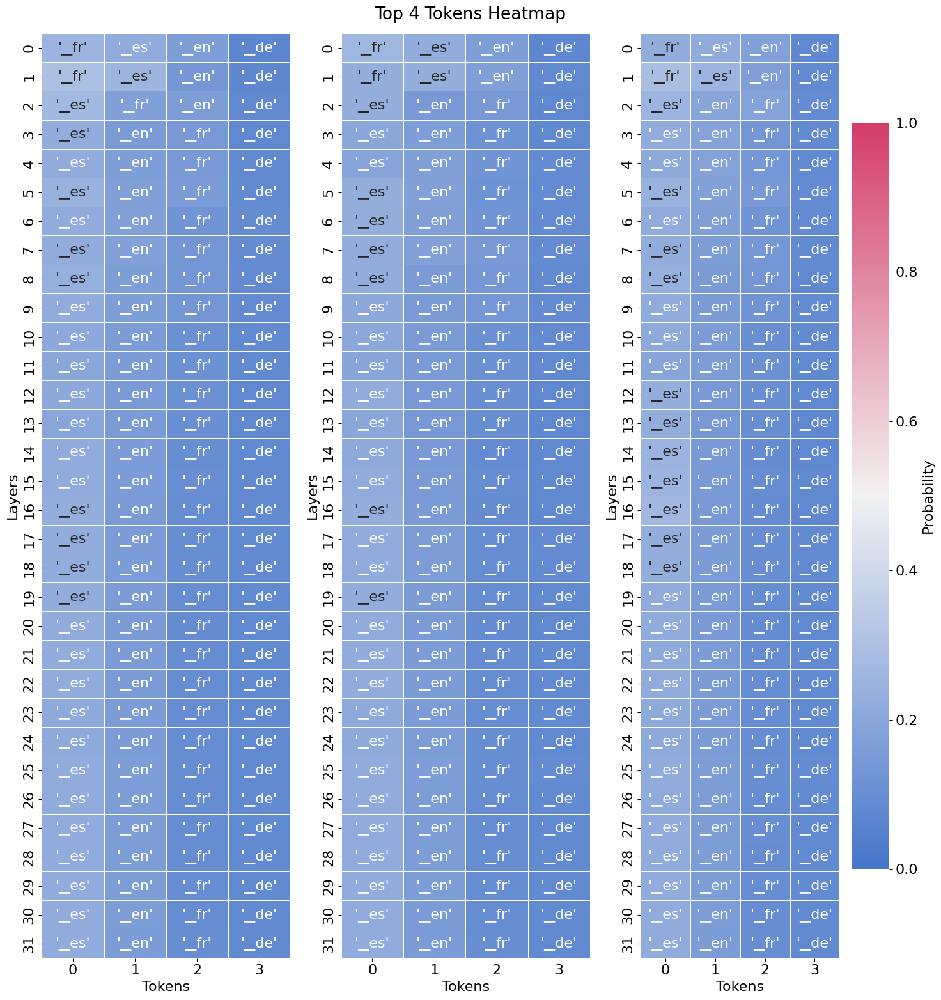

In [44]:
plot_topk_tokens(patch_attention_lens(nn_model, source_prompts_str, identify_language4), tokenizer)

In [45]:
print(source_prompts_str[0])

Español: "reunión" - 中文: "會議"
Español: "oficina" - 中文: "辦公室"
Español: "palabra" - 中文: "詞"
Español: "primavera" - 中文: "春天"
Español: "mano" - 中文: "手"
Español: "puente


In [47]:
from exp_tools import patchscope_lens

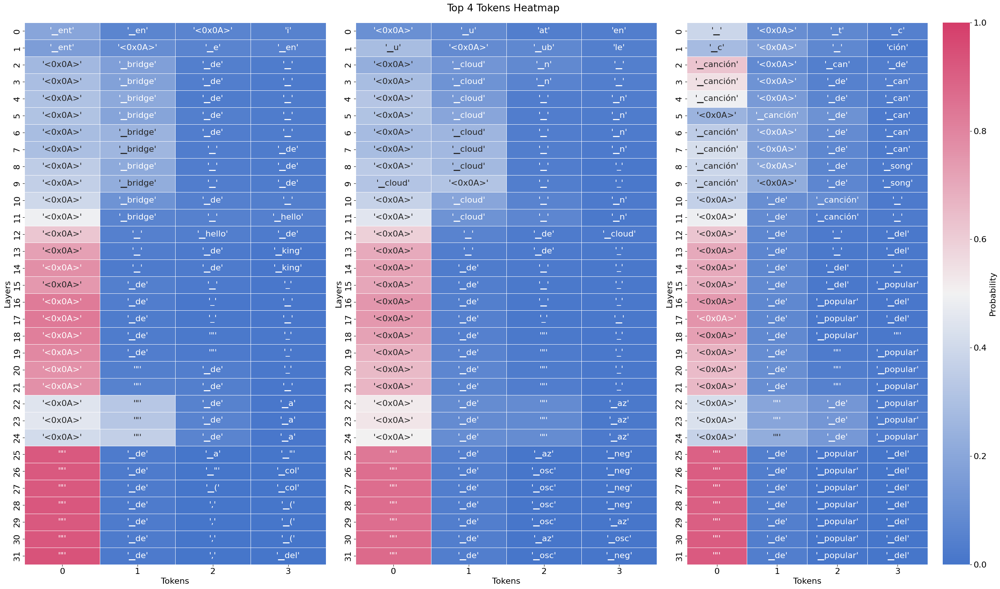

In [49]:
plot_topk_tokens(patchscope_lens(nn_model, source_prompts_str), tokenizer)